# Author: Raquel Ana M Bush
# MTH 565 - Spotify Feature Network

In [2]:
import pandas as pd
import networkx as nx
import numpy as np
from matplotlib import pyplot as plt
from math import ceil
from ast import literal_eval
import community.community_louvain as community_louvain
from collections import defaultdict
import random

# load data:
nodes_path = '/Users/raquelanabush/Library/Mobile Documents/com~apple~CloudDocs/Documents/MTH565_final_project/nodes.csv'
edges_path = '/Users/raquelanabush/Library/Mobile Documents/com~apple~CloudDocs/Documents/MTH565_final_project/edges.csv'
nodes_df = pd.read_csv(nodes_path)
edges_df = pd.read_csv(edges_path)

# print first 5 rows of each csv file:
print("Nodes:")
print(nodes_df.head())

print("\nEdges:")
print(edges_df.head())

# to calculate diameter:
def calculate_diameter(G):
    if nx.is_connected(G):
        return nx.diameter(G)
    else:
        return float('inf')  # Infinite diameter if graph is disconnected.

# to generate random graphs:
def generate_graphs(n, p, num_samples):
    graphs = []
    for i in range(num_samples):
        G_random = nx.gnp_random_graph(n, p)
        graphs.append(G_random)
    return graphs

# to visualize a specific subgraph:
def visualize_genre_subgraph(subgraph, about):
    pos = nx.spring_layout(subgraph, seed=42)  # use seed for consistency
    plt.figure(figsize=(10, 10))
    nx.draw_networkx_nodes(subgraph, pos, node_size=20, node_color="skyblue", alpha=0.8)
    nx.draw_networkx_edges(subgraph, pos, edge_color="lightgray", alpha=0.5)
    plt.title(f"Visualization of {about} subgraph")
    plt.axis("off")
    plt.show()

Nodes:
               spotify_id                name  followers  popularity  \
0  48WvrUGoijadXXCsGocwM4           Byklubben     1738.0          24   
1  4lDiJcOJ2GLCK6p9q5BgfK            Kontra K  1999676.0          72   
2  652XIvIBNGg3C0KIGEJWit               Maxim    34596.0          36   
3  3dXC1YPbnQPsfHPVkm1ipj  Christopher Martin   249233.0          52   
4  74terC9ol9zMo8rfzhSOiG       Jakob Hellman    21193.0          39   

                                              genres  \
0                     ['nordic house', 'russelater']   
1             ['christlicher rap', 'german hip hop']   
2                                                 []   
3  ['dancehall', 'lovers rock', 'modern reggae', ...   
4  ['classic swedish pop', 'norrbotten indie', 's...   

                                          chart_hits  
0                                         ['no (3)']  
1  ['at (44)', 'de (111)', 'lu (22)', 'ch (31)', ...  
2                                         ['de (1)']  
3  

In [3]:
# runtime 9s

# create the graph:
G = nx.Graph()

# add nodes:
for _, row in nodes_df.iterrows():
    G.add_node(row['spotify_id'])

# add edges:
for _, row in edges_df.iterrows():
    G.add_edge(row['id_0'], row['id_1'])

# count nodes and edges:
node_count = G.number_of_nodes()
print("Node count:", node_count)

edge_count = G.number_of_edges()
print("Edge count:", edge_count)

Node count: 156326
Edge count: 300386


In [4]:
# runtime 9s

# add node attributes from nodes_df to G:
nodes_df = pd.read_csv('/Users/raquelanabush/Library/Mobile Documents/com~apple~CloudDocs/Documents/MTH565_final_project/nodes.csv')
nodes_df['genres'] = nodes_df['genres'].apply(lambda x: literal_eval(x) if isinstance(x, str) else [])

for _, row in nodes_df.iterrows():
    node_id = row['spotify_id']
    G.nodes[node_id]['genres'] = row['genres']  # add genres list to each node

for _, row in nodes_df.iterrows():
    node_id = row['spotify_id']
    G.nodes[node_id]['name'] = row['name']  # add artist names to each node

for _, row in nodes_df.iterrows():
    node_id = row['spotify_id']
    G.nodes[node_id]['popularity'] = row['popularity']  # add popularity scores to each node

for _, row in nodes_df.iterrows():
    node_id = row['spotify_id']
    G.nodes[node_id]['chart_hits'] = row['chart_hits']  # add chart hits to each node

# verify node data:
print("Sample node data:")
list(G.nodes(data=True))[:5]

Sample node data:


[('48WvrUGoijadXXCsGocwM4',
  {'genres': ['nordic house', 'russelater'],
   'name': 'Byklubben',
   'popularity': 24,
   'chart_hits': "['no (3)']"}),
 ('4lDiJcOJ2GLCK6p9q5BgfK',
  {'genres': ['christlicher rap', 'german hip hop'],
   'name': 'Kontra K',
   'popularity': 72,
   'chart_hits': "['at (44)', 'de (111)', 'lu (22)', 'ch (31)', 'vn (1)']"}),
 ('652XIvIBNGg3C0KIGEJWit',
  {'genres': [],
   'name': 'Maxim',
   'popularity': 36,
   'chart_hits': "['de (1)']"}),
 ('3dXC1YPbnQPsfHPVkm1ipj',
  {'genres': ['dancehall', 'lovers rock', 'modern reggae', 'reggae fusion'],
   'name': 'Christopher Martin',
   'popularity': 52,
   'chart_hits': "['at (1)', 'de (1)']"}),
 ('74terC9ol9zMo8rfzhSOiG',
  {'genres': ['classic swedish pop', 'norrbotten indie', 'swedish pop'],
   'name': 'Jakob Hellman',
   'popularity': 39,
   'chart_hits': "['se (6)']"})]

In [5]:
# runtime 4s

# Calculate diameter:
spotify_diameter = calculate_diameter(G)
print("Spotify Network Diameter:", spotify_diameter)

# Find all connected components in the graph
components = [G.subgraph(c).copy() for c in nx.connected_components(G)]
print(f"There are {len(components)} connected components.")

Spotify Network Diameter: inf
There are 4338 connected components.


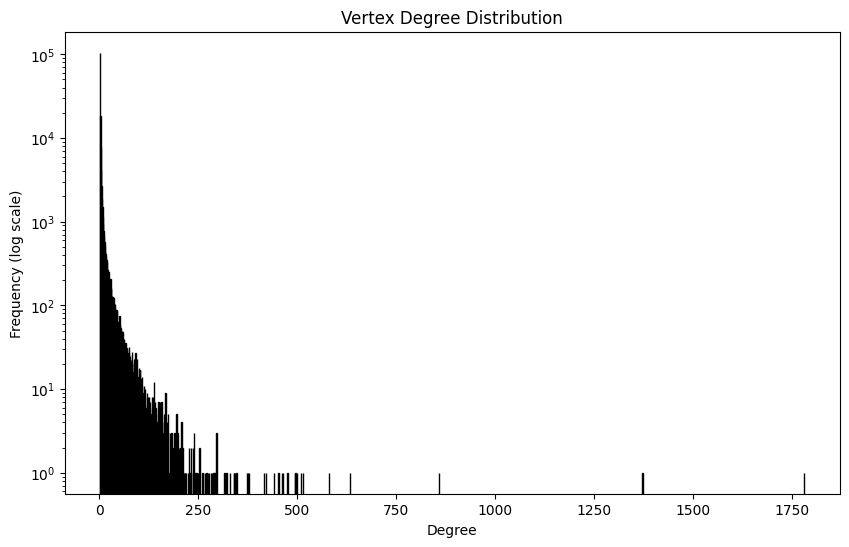

In [6]:
# runtime 2s

degrees = [degree for node, degree in G.degree()]
plt.figure(figsize=(10, 6))
plt.hist(degrees, bins=range(1, max(degrees) + 1), edgecolor='black')
plt.yscale('log')  # log scale to highlight heavy tails
plt.xlabel("Degree")
plt.ylabel("Frequency (log scale)")
plt.title("Vertex Degree Distribution")
plt.show()

In [7]:
# runtime 0s

degree_threshold = 200

# find nodes with degree above the threshold:
outlier_nodes = [node for node, degree in G.degree() if degree > degree_threshold]
print(f"Number of artists with over 200 collaborations on Spotify:\n")

# print outlier nodes & their degrees:
for node in outlier_nodes:
    artist_name = G.nodes[node].get('name', 'Unknown')
    print(f"Artist: {artist_name}, Degree: {G.degree(node)}")

Number of artists with over 200 collaborations on Spotify:

Artist: Shaggy, Degree: 226
Artist: Ennio Morricone, Degree: 276
Artist: MOTi, Degree: 246
Artist: NERVO, Degree: 293
Artist: Tritonal, Degree: 243
Artist: Flo Rida, Degree: 244
Artist: Armin van Buuren, Degree: 513
Artist: Wyclef Jean, Degree: 260
Artist: DJ Gollum, Degree: 215
Artist: Dillon Francis, Degree: 216
Artist: Alkpote, Degree: 242
Artist: Busta Rhymes, Degree: 205
Artist: Eko Fresh, Degree: 231
Artist: Ty Dolla $ign, Degree: 252
Artist: John Williams, Degree: 415
Artist: Brray, Degree: 213
Artist: Kaskade, Degree: 281
Artist: Moby, Degree: 340
Artist: Yuvan Shankar Raja, Degree: 315
Artist: J Alvarez, Degree: 204
Artist: Mc Gw, Degree: 858
Artist: Dimitri Vegas & Like Mike, Degree: 226
Artist: Afrojack, Degree: 252
Artist: Sean Paul, Degree: 236
Artist: Rudimental, Degree: 202
Artist: Quimico Ultra Mega, Degree: 295
Artist: INNA, Degree: 288
Artist: Farruko, Degree: 284
Artist: Diplo, Degree: 494
Artist: Gucci Mane

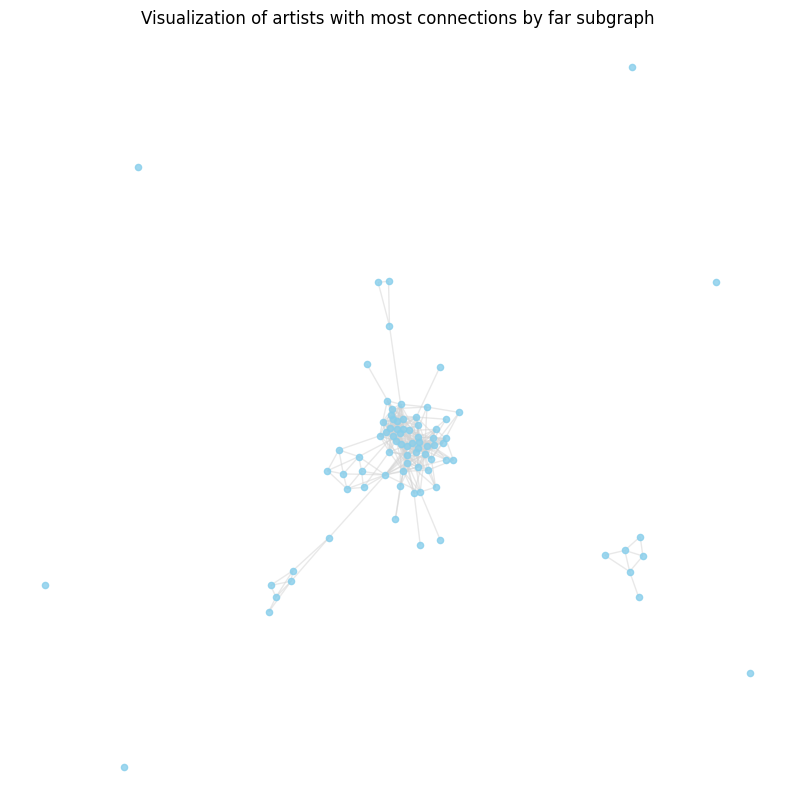

In [8]:
# runtime 0s

high_degree_subgraph = G.subgraph(outlier_nodes).copy()
visualize_genre_subgraph(high_degree_subgraph, 'artists with most connections by far')

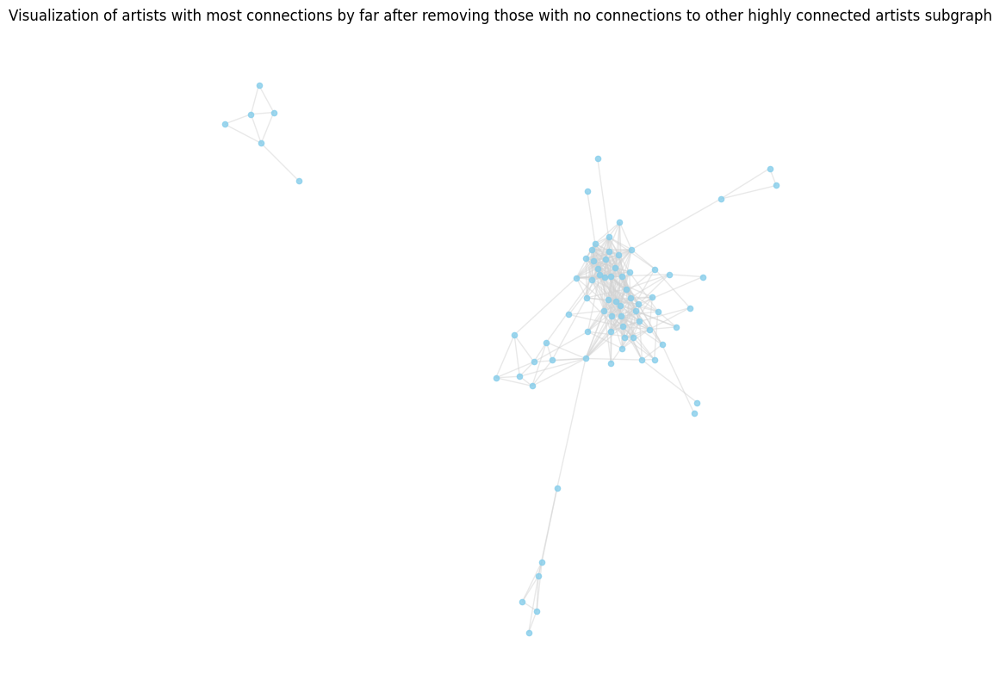

In [9]:
# runtime 0s

# cutting out those with 0 connections with other highly connected artists:
isolated_nodes = list(nx.isolates(high_degree_subgraph))
high_degree_subgraph.remove_nodes_from(isolated_nodes)
visualize_genre_subgraph(high_degree_subgraph, 'artists with most connections by far after removing those with no connections to other highly connected artists')

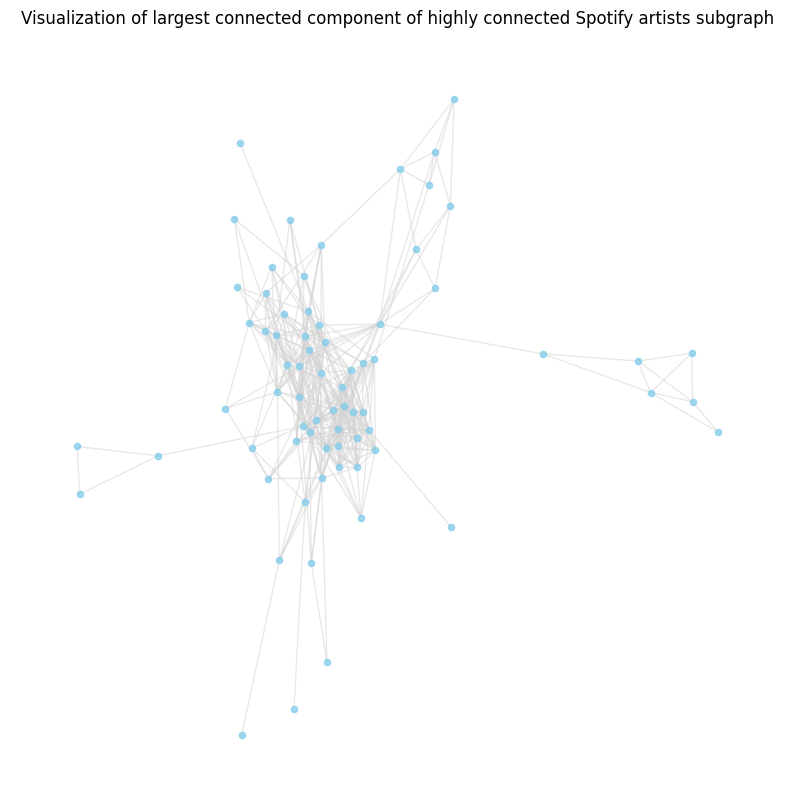

In [10]:
# runtime 0s

# look at the largest connected component:
largest_cc = max(nx.connected_components(high_degree_subgraph), key=len)
largest_cc = high_degree_subgraph.subgraph(largest_cc).copy()
visualize_genre_subgraph(largest_cc, 'largest connected component of highly connected Spotify artists')

In [11]:
# runtime 0s

# find top 15 artists by degree in the largest connected component:
top_15_artists = sorted(largest_cc.degree, key=lambda x: x[1], reverse=True)[:15]
print(f"\n15 most connected artist(s) in the highly connected artists subgraph by number of connections:")
for artist, degree in top_15_artists:
    artist_name = G.nodes[artist].get('name', 'Unknown')
    print(f"Artist: {artist_name}, Connections: {degree}")


15 most connected artist(s) in the highly connected artists subgraph by number of connections:
Artist: Steve Aoki, Connections: 23
Artist: Ty Dolla $ign, Connections: 22
Artist: Gucci Mane, Connections: 22
Artist: French Montana, Connections: 22
Artist: Chris Brown, Connections: 21
Artist: Tiësto, Connections: 21
Artist: David Guetta, Connections: 20
Artist: Afrojack, Connections: 20
Artist: Lil Wayne, Connections: 20
Artist: Snoop Dogg, Connections: 20
Artist: R3HAB, Connections: 19
Artist: 2 Chainz, Connections: 19
Artist: The Game, Connections: 18
Artist: Rick Ross, Connections: 17
Artist: Wiz Khalifa, Connections: 17


In [12]:
# runtime 4s

# Find connected components and their sizes
components = sorted([[G.subgraph(c).copy(), len(c)] for c in nx.connected_components(G)], key=lambda x: x[1], reverse=True)

# Print the sizes of each component
for component in components[0:10]:
    print(component[1])

largest_component = components[0][0]

148386
66
37
22
21
21
21
20
19
16


In [13]:
# runtime 9s

# Approximate diameter calculation using eccentricities on a subset of nodes (average of 10 approximations)
largest_c_diameters = []
for i in range(10):
    largest_c_diameter = nx.approximation.diameter(largest_component)
    largest_c_diameters.append(largest_c_diameter)
print(f"Diamter approximations: {largest_c_diameters}")
largest_c_avg_diameter = sum(largest_c_diameters) / len(largest_c_diameters)
print(f"Average diameter: {largest_c_avg_diameter}")

# Calculate global clustering coefficient:
largest_c_clustering = nx.average_clustering(largest_component)

# Calculate density:
largest_c_density = nx.density(G)

print(f"\nLargest component size: {len(largest_component)}")
print(f"Diameter of this component: {largest_c_diameter}")
print(f"Global clustering coefficient of this component: {largest_c_clustering}")
print(f"Density of this component: {largest_c_density}")


Diamter approximations: [24, 24, 24, 24, 24, 24, 24, 24, 24, 24]
Average diameter: 24.0

Largest component size: 148386
Diameter of this component: 24
Global clustering coefficient of this component: 0.08504040224253798
Density of this component: 2.458385754043054e-05


***Generating random graphs to see global clustering and find expected diameter:***

In [14]:
# runtime 10min per graph (30min total)

# experimenting to find random graph stats:
n = len(largest_component)
p = largest_c_density

# generate & draw 3 samples:
random_graphs = generate_graphs(n, p, 3)

# analyze each:
for random_G in random_graphs:
    # check if random graph sample is connected. if not, use largest connected component:
    if not nx.is_connected(random_G):
        largest_cc = max(nx.connected_components(random_G), key=len)
        random_G = random_G.subgraph(largest_cc).copy()

    # approximate diameter calculation using largest connected component:
    randomG_diameter = nx.approximation.diameter(random_G)
    print(f"Approximate diameter: {randomG_diameter}")
        
    # calculate global clustering coefficient:
    randomG_clustering = nx.average_clustering(random_G)
    print(f"Global clustering: {randomG_clustering}")

    print('')

Approximate diameter: 22
Global clustering: 1.2867838317788322e-05

Approximate diameter: 20
Global clustering: 1.5127223916603415e-05

Approximate diameter: 19
Global clustering: 4.926067305992538e-06



***Generating regular lattices to see diameter and find expected global clustering:***

In [15]:
# runtime 0s

# decide k:
k = (2 * edge_count) / len(largest_component)
print(k)
k = int(k)
print(f"k = {k}")

4.048710794818918
k = 4


In [16]:
# runtime 1s

# generate regular lattice:
reg_lat = nx.watts_strogatz_graph(n, k, 0)

# diameter calculation:
reg_lat_diameter = ceil(n / (2 * k))
print(f"Regular lattice diameter: {reg_lat_diameter}")
        
# calculate global clustering coefficient:
reg_lat_clustering = nx.average_clustering(reg_lat)
print(f"Global clustering: {reg_lat_clustering}")

Regular lattice diameter: 18549
Global clustering: 0.5


***Analyzing subgraphs for specific genres:***

In [17]:
# runtime 1s

# load the nodes data to check genre distribution:
nodes_df = pd.read_csv('/Users/raquelanabush/Library/Mobile Documents/com~apple~CloudDocs/Documents/MTH565_final_project/nodes.csv')

# count genre occurrences:
nodes_df['genres'] = nodes_df['genres'].apply(lambda x: eval(x) if pd.notnull(x) else [])
genre_counts = nodes_df['genres'].explode().value_counts()

# display the most common genres to help decide which ones to pick (top 15)
genre_counts.head(15)

genres
pop               544
electro house     513
dance pop         506
edm               453
rap               448
german hip hop    434
uk pop            406
pop rap           395
french hip hop    384
hip hop           381
pop dance         379
pop edm           368
tropical house    356
filmi             353
funk carioca      351
Name: count, dtype: int64

In [18]:
# runtime 1s

# verify that genres are parsed correctly:
print(nodes_df[['spotify_id', 'genres']].head())

               spotify_id                                             genres
0  48WvrUGoijadXXCsGocwM4                         [nordic house, russelater]
1  4lDiJcOJ2GLCK6p9q5BgfK                 [christlicher rap, german hip hop]
2  652XIvIBNGg3C0KIGEJWit                                                 []
3  3dXC1YPbnQPsfHPVkm1ipj  [dancehall, lovers rock, modern reggae, reggae...
4  74terC9ol9zMo8rfzhSOiG  [classic swedish pop, norrbotten indie, swedis...


german hip hop - Total nodes: 434, Isolated nodes: 20, Isolated percentage: 4.61%

20 most connected artist(s) in german hip hop by number of connections:
Artist: Capital Bra, Connections: 55
Artist: Olexesh, Connections: 55
Artist: Manuellsen, Connections: 53
Artist: Haftbefehl, Connections: 49
Artist: Nimo, Connections: 47
Artist: Celo & Abdi, Connections: 45
Artist: Farid Bang, Connections: 44
Artist: Sido, Connections: 42
Artist: Summer Cem, Connections: 42
Artist: RAF Camora, Connections: 41
Artist: KC Rebell, Connections: 39
Artist: Kool Savas, Connections: 38
Artist: XATAR, Connections: 37
Artist: Azzi Memo, Connections: 36
Artist: GRiNGO, Connections: 35
Artist: Bausa, Connections: 34
Artist: Azad, Connections: 34
Artist: Bonez MC, Connections: 34
Artist: Massiv, Connections: 34
Artist: Ufo361, Connections: 33

Diameter for german hip hop: 9
Global clustering for german hip hop: 0.2591539253881741


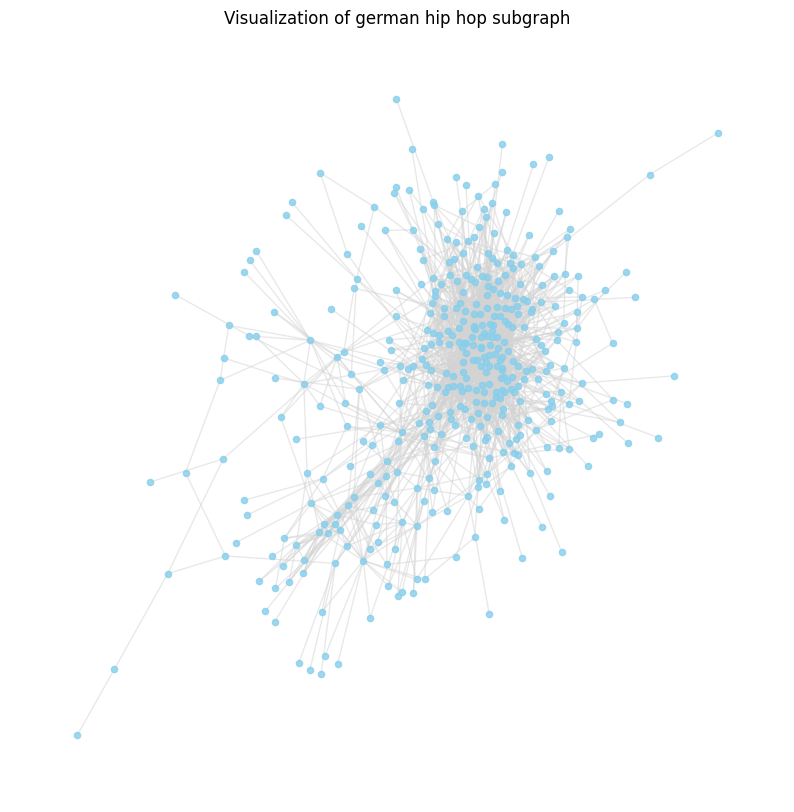

dance pop - Total nodes: 505, Isolated nodes: 61, Isolated percentage: 12.08%

20 most connected artist(s) in dance pop by number of connections:
Artist: R3HAB, Connections: 90
Artist: David Guetta, Connections: 87
Artist: Tiësto, Connections: 63
Artist: Pitbull, Connections: 58
Artist: Ty Dolla $ign, Connections: 56
Artist: Steve Aoki, Connections: 53
Artist: Nicki Minaj, Connections: 49
Artist: Chris Brown, Connections: 47
Artist: Sean Paul, Connections: 46
Artist: Afrojack, Connections: 46
Artist: MOTi, Connections: 45
Artist: Clean Bandit, Connections: 43
Artist: Major Lazer, Connections: 42
Artist: Cheat Codes, Connections: 41
Artist: Ludacris, Connections: 41
Artist: Flo Rida, Connections: 40
Artist: Dimitri Vegas & Like Mike, Connections: 40
Artist: Don Diablo, Connections: 39
Artist: Missy Elliott, Connections: 37
Artist: Benny Benassi, Connections: 37

Diameter for dance pop: 8
Global clustering for dance pop: 0.18297026753481982


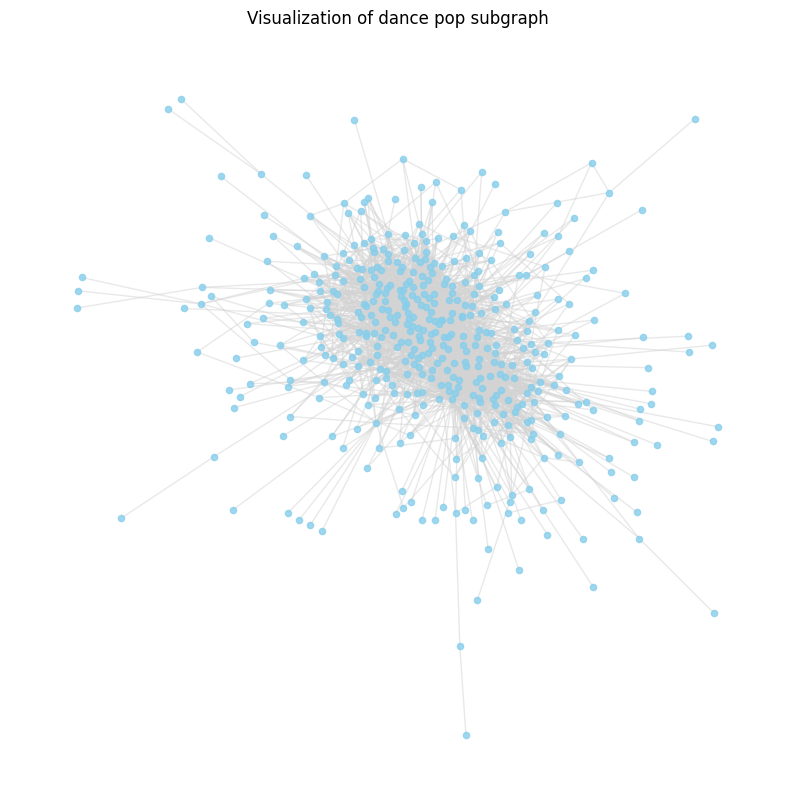

pop - Total nodes: 544, Isolated nodes: 79, Isolated percentage: 14.52%

20 most connected artist(s) in pop by number of connections:
Artist: R3HAB, Connections: 90
Artist: Ty Dolla $ign, Connections: 66
Artist: David Guetta, Connections: 62
Artist: Tiësto, Connections: 57
Artist: Nicki Minaj, Connections: 51
Artist: Khalid, Connections: 41
Artist: Calvin Harris, Connections: 41
Artist: Chris Brown, Connections: 41
Artist: Justin Bieber, Connections: 40
Artist: Cheat Codes, Connections: 39
Artist: Major Lazer, Connections: 38
Artist: Charli XCX, Connections: 37
Artist: Diplo, Connections: 37
Artist: G-Eazy, Connections: 35
Artist: Joel Corry, Connections: 35
Artist: Sam Feldt, Connections: 34
Artist: Clean Bandit, Connections: 34
Artist: Kygo, Connections: 34
Artist: DJ Khaled, Connections: 33
Artist: Ed Sheeran, Connections: 33

Diameter for pop: 7
Global clustering for pop: 0.15543253625460068


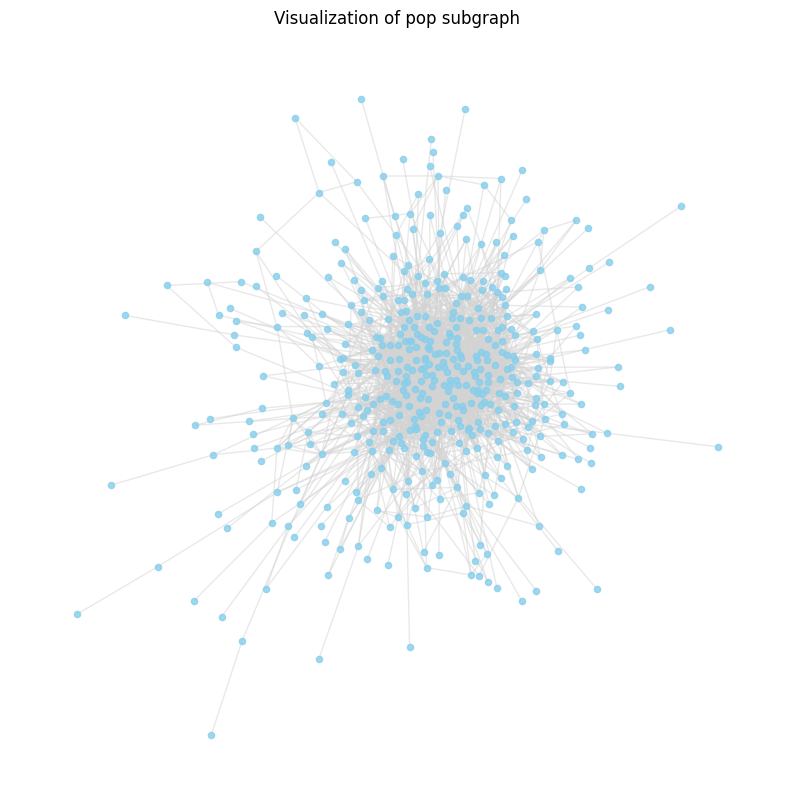

uk pop - Total nodes: 406, Isolated nodes: 171, Isolated percentage: 42.12%

20 most connected artist(s) in uk pop by number of connections:
Artist: Jonas Blue, Connections: 31
Artist: Sam Feldt, Connections: 30
Artist: Cheat Codes, Connections: 27
Artist: Rudimental, Connections: 25
Artist: Martin Jensen, Connections: 23
Artist: Clean Bandit, Connections: 20
Artist: Sigala, Connections: 19
Artist: M-22, Connections: 19
Artist: Matoma, Connections: 18
Artist: NOTD, Connections: 18
Artist: MK, Connections: 17
Artist: Ed Sheeran, Connections: 17
Artist: Jax Jones, Connections: 16
Artist: Demi Lovato, Connections: 16
Artist: Anne-Marie, Connections: 16
Artist: Tinie Tempah, Connections: 15
Artist: Rita Ora, Connections: 15
Artist: Becky Hill, Connections: 15
Artist: MNEK, Connections: 15
Artist: Charli XCX, Connections: 15

Diameter for uk pop: 9
Global clustering for uk pop: 0.08903376160316774


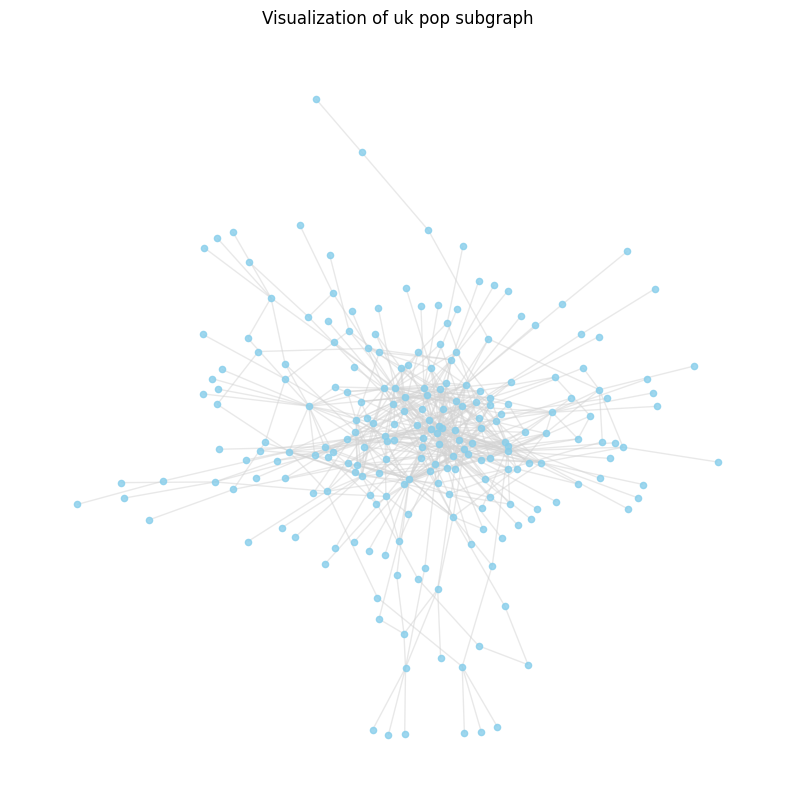

hip hop - Total nodes: 381, Isolated nodes: 52, Isolated percentage: 13.65%

20 most connected artist(s) in hip hop by number of connections:
Artist: Snoop Dogg, Connections: 89
Artist: The Game, Connections: 83
Artist: Gucci Mane, Connections: 80
Artist: Lil Wayne, Connections: 78
Artist: Ty Dolla $ign, Connections: 74
Artist: T.I., Connections: 74
Artist: 2 Chainz, Connections: 72
Artist: DJ Drama, Connections: 71
Artist: French Montana, Connections: 69
Artist: Rick Ross, Connections: 67
Artist: Busta Rhymes, Connections: 66
Artist: DJ Khaled, Connections: 61
Artist: Wiz Khalifa, Connections: 57
Artist: Jeezy, Connections: 55
Artist: Young Thug, Connections: 55
Artist: Meek Mill, Connections: 54
Artist: Nas, Connections: 53
Artist: Big Sean, Connections: 53
Artist: Ludacris, Connections: 52
Artist: JAY-Z, Connections: 51

Diameter for hip hop: 7
Global clustering for hip hop: 0.3213617764789591


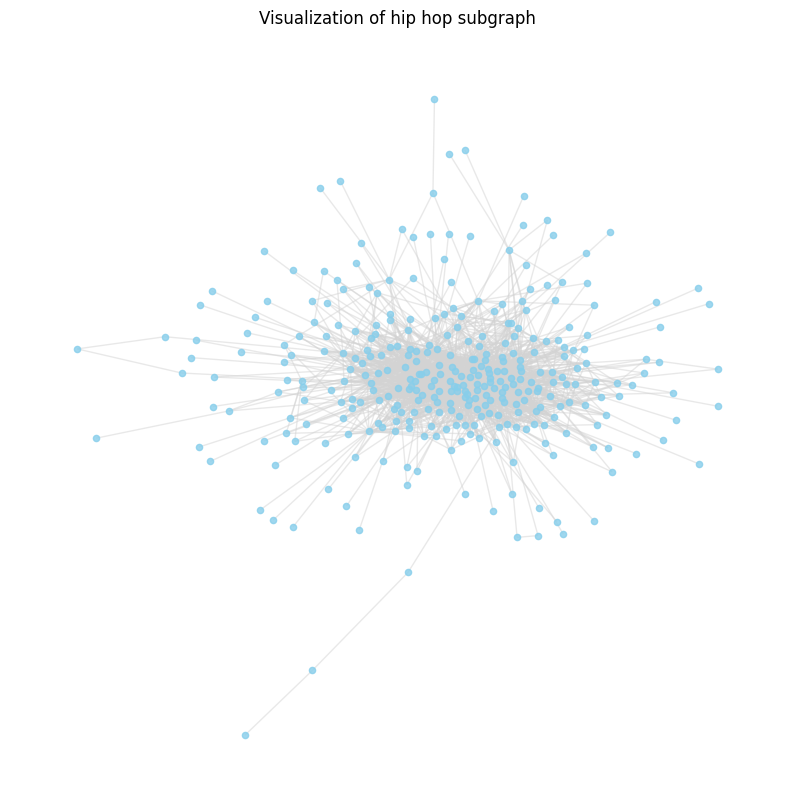

rap - Total nodes: 448, Isolated nodes: 28, Isolated percentage: 6.25%

20 most connected artist(s) in rap by number of connections:
Artist: Gucci Mane, Connections: 130
Artist: Lil Wayne, Connections: 101
Artist: French Montana, Connections: 100
Artist: Future, Connections: 100
Artist: 2 Chainz, Connections: 99
Artist: Young Thug, Connections: 94
Artist: The Game, Connections: 93
Artist: T.I., Connections: 91
Artist: Snoop Dogg, Connections: 89
Artist: DJ Khaled, Connections: 88
Artist: DJ Drama, Connections: 85
Artist: Rick Ross, Connections: 85
Artist: Wiz Khalifa, Connections: 82
Artist: Yo Gotti, Connections: 80
Artist: Juicy J, Connections: 79
Artist: Meek Mill, Connections: 77
Artist: Jeezy, Connections: 76
Artist: Lil Durk, Connections: 76
Artist: YG, Connections: 72
Artist: Big Sean, Connections: 69

Diameter for rap: 6
Global clustering for rap: 0.34055141677639184


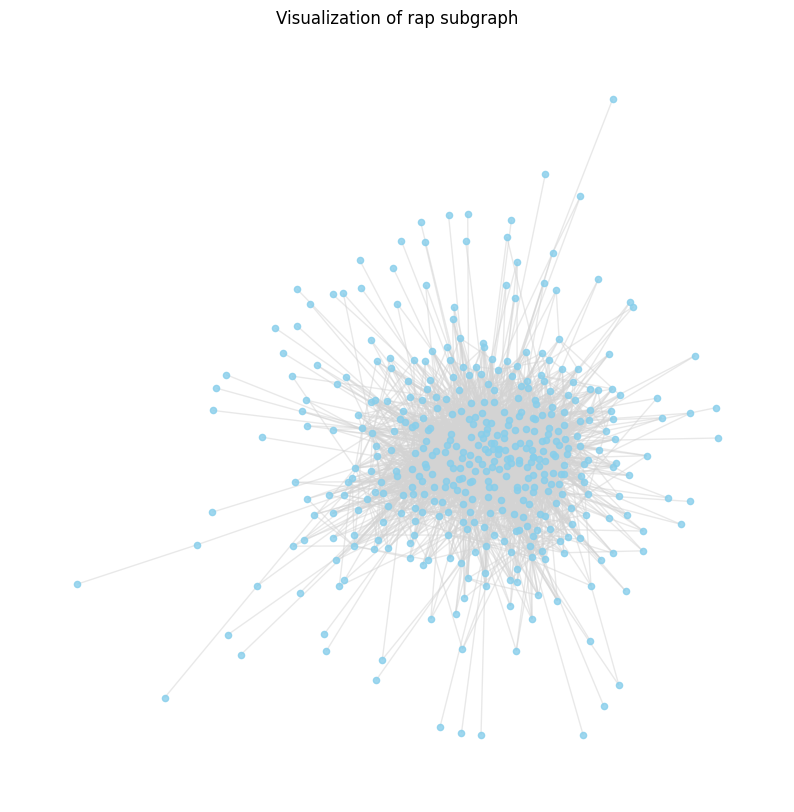

electro house - Total nodes: 512, Isolated nodes: 48, Isolated percentage: 9.38%

20 most connected artist(s) in electro house by number of connections:
Artist: Steve Aoki, Connections: 102
Artist: Hardwell, Connections: 63
Artist: Diplo, Connections: 59
Artist: R3HAB, Connections: 55
Artist: Dimitri Vegas & Like Mike, Connections: 54
Artist: Afrojack, Connections: 53
Artist: Martin Garrix, Connections: 50
Artist: Nicky Romero, Connections: 49
Artist: Galantis, Connections: 49
Artist: Dillon Francis, Connections: 48
Artist: NERVO, Connections: 45
Artist: MOTi, Connections: 43
Artist: Tchami, Connections: 39
Artist: Zeds Dead, Connections: 39
Artist: Kaskade, Connections: 38
Artist: Good Times Ahead, Connections: 35
Artist: A-Trak, Connections: 34
Artist: Cash Cash, Connections: 34
Artist: Quintino, Connections: 34
Artist: Timmy Trumpet, Connections: 34

Diameter for electro house: 7
Global clustering for electro house: 0.1782269055821512


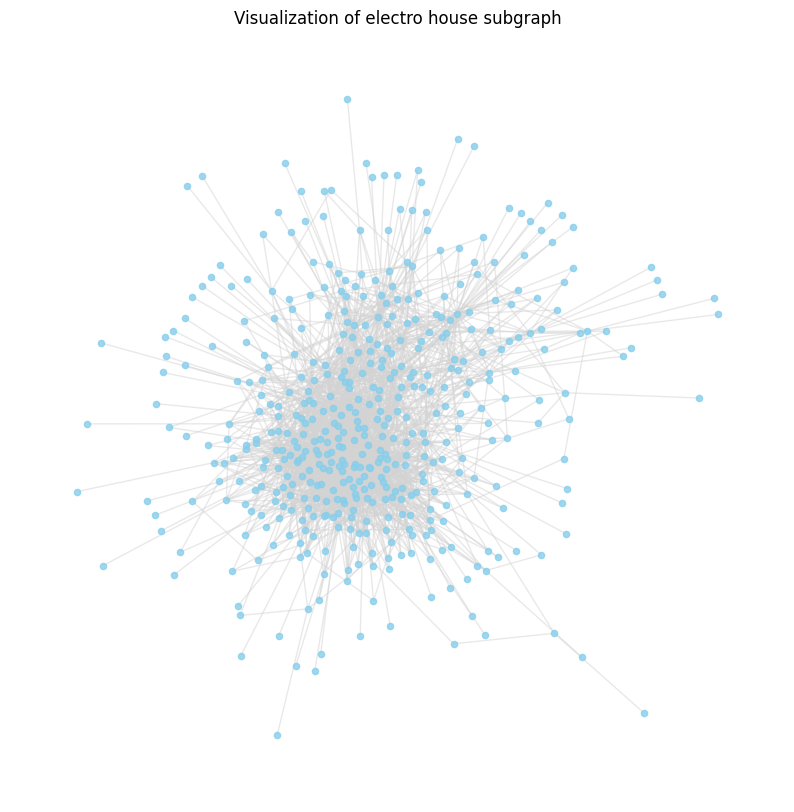

r&b - Total nodes: 299, Isolated nodes: 77, Isolated percentage: 25.75%

20 most connected artist(s) in r&b by number of connections:
Artist: Wale, Connections: 42
Artist: Ty Dolla $ign, Connections: 41
Artist: Chris Brown, Connections: 41
Artist: Fabolous, Connections: 33
Artist: Diddy, Connections: 27
Artist: Mariah Carey, Connections: 27
Artist: Missy Elliott, Connections: 26
Artist: Eric Bellinger, Connections: 25
Artist: 6LACK, Connections: 23
Artist: T-Pain, Connections: 22
Artist: Mary J. Blige, Connections: 20
Artist: Lucky Daye, Connections: 20
Artist: Trey Songz, Connections: 20
Artist: Big Sean, Connections: 19
Artist: Tory Lanez, Connections: 19
Artist: Kehlani, Connections: 19
Artist: Jhené Aiko, Connections: 18
Artist: Jeremih, Connections: 17
Artist: Jacquees, Connections: 17
Artist: K CAMP, Connections: 17

Diameter for r&b: 6
Global clustering for r&b: 0.2017240581787275


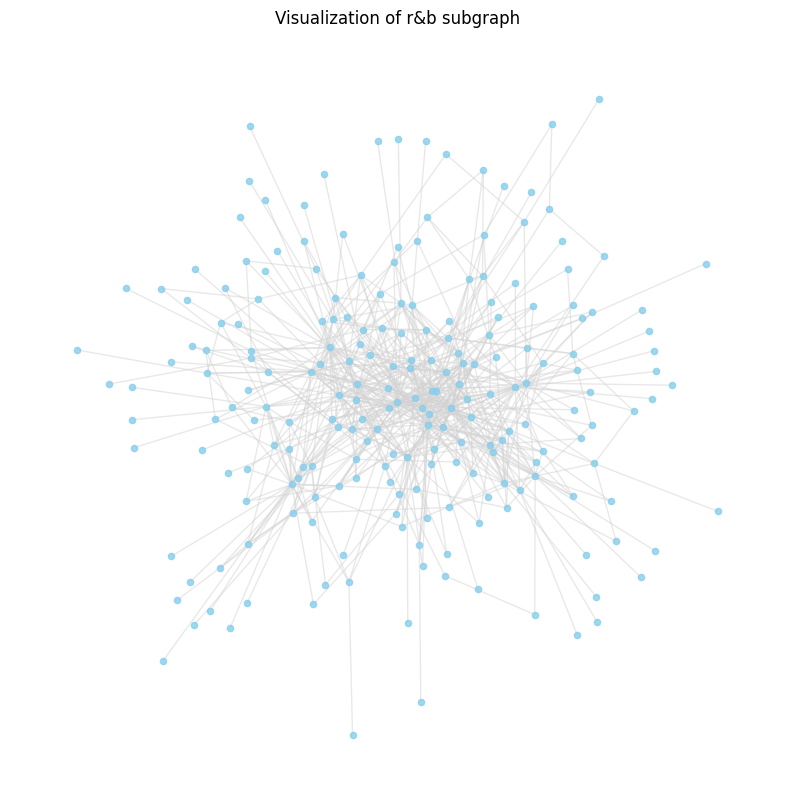

tropical house - Total nodes: 355, Isolated nodes: 29, Isolated percentage: 8.17%

20 most connected artist(s) in tropical house by number of connections:
Artist: Tiësto, Connections: 56
Artist: R3HAB, Connections: 47
Artist: MOTi, Connections: 43
Artist: Sam Feldt, Connections: 40
Artist: Robin Schulz, Connections: 39
Artist: Steve Aoki, Connections: 38
Artist: Clean Bandit, Connections: 36
Artist: Alle Farben, Connections: 34
Artist: Dimitri Vegas & Like Mike, Connections: 33
Artist: Diplo, Connections: 33
Artist: Rudimental, Connections: 32
Artist: Afrojack, Connections: 32
Artist: Lost Frequencies, Connections: 31
Artist: HUGEL, Connections: 31
Artist: Cheat Codes, Connections: 30
Artist: Nicky Romero, Connections: 30
Artist: Galantis, Connections: 30
Artist: Becky Hill, Connections: 28
Artist: Joel Corry, Connections: 27
Artist: Jonas Blue, Connections: 27

Diameter for tropical house: 8
Global clustering for tropical house: 0.14357584845929872


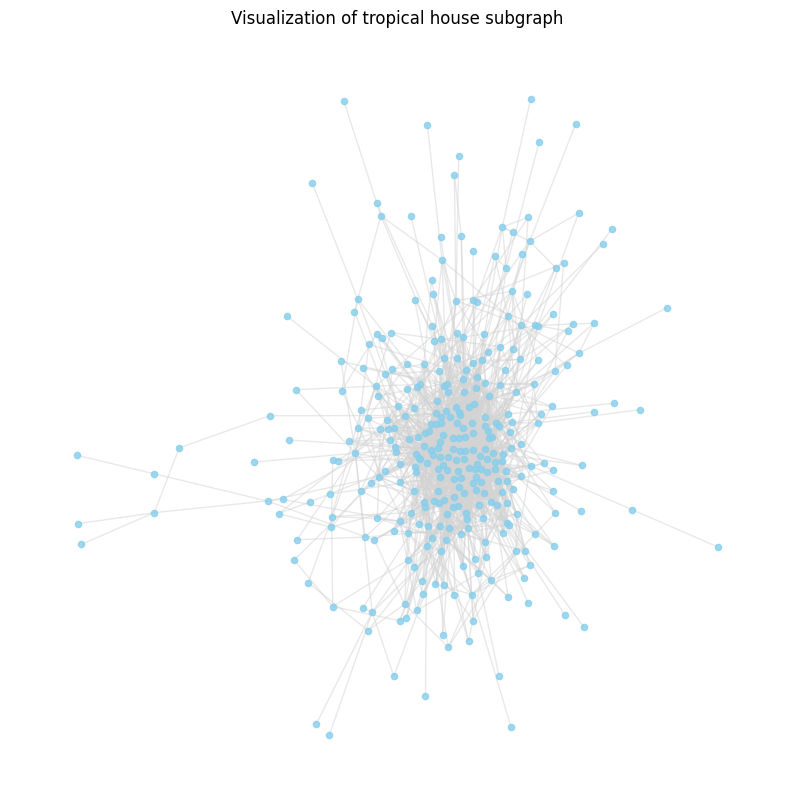

french hip hop - Total nodes: 382, Isolated nodes: 31, Isolated percentage: 8.12%

20 most connected artist(s) in french hip hop by number of connections:
Artist: Le classico organisé, Connections: 75
Artist: Leto, Connections: 65
Artist: Alonzo, Connections: 65
Artist: Alkpote, Connections: 59
Artist: DJ Kayz, Connections: 50
Artist: Koba LaD, Connections: 50
Artist: Rim'K, Connections: 47
Artist: Naps, Connections: 47
Artist: DA Uzi, Connections: 46
Artist: Sadek, Connections: 46
Artist: Lacrim, Connections: 45
Artist: Naza, Connections: 45
Artist: Sofiane, Connections: 44
Artist: Soprano, Connections: 41
Artist: Ninho, Connections: 41
Artist: SCH, Connections: 39
Artist: PLK, Connections: 36
Artist: Niska, Connections: 36
Artist: RK, Connections: 34
Artist: Hornet La Frappe, Connections: 34

Diameter for french hip hop: 7
Global clustering for french hip hop: 0.23540070642300626


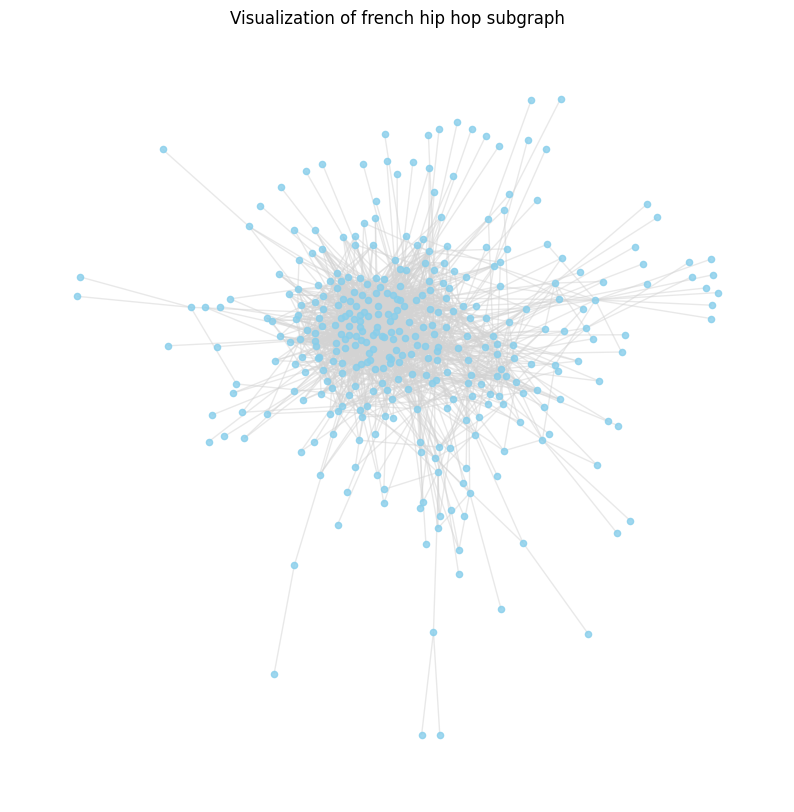

edm - Total nodes: 452, Isolated nodes: 16, Isolated percentage: 3.54%

20 most connected artist(s) in edm by number of connections:
Artist: Tiësto, Connections: 93
Artist: Steve Aoki, Connections: 89
Artist: R3HAB, Connections: 71
Artist: David Guetta, Connections: 68
Artist: Armin van Buuren, Connections: 65
Artist: Diplo, Connections: 58
Artist: Dimitri Vegas & Like Mike, Connections: 57
Artist: MOTi, Connections: 57
Artist: Hardwell, Connections: 53
Artist: Afrojack, Connections: 53
Artist: ILLENIUM, Connections: 52
Artist: Dillon Francis, Connections: 51
Artist: Nicky Romero, Connections: 47
Artist: Galantis, Connections: 47
Artist: The Chainsmokers, Connections: 45
Artist: Martin Garrix, Connections: 45
Artist: Sam Feldt, Connections: 43
Artist: Tritonal, Connections: 42
Artist: Kaskade, Connections: 41
Artist: NERVO, Connections: 40

Diameter for edm: 7
Global clustering for edm: 0.21343003396405225


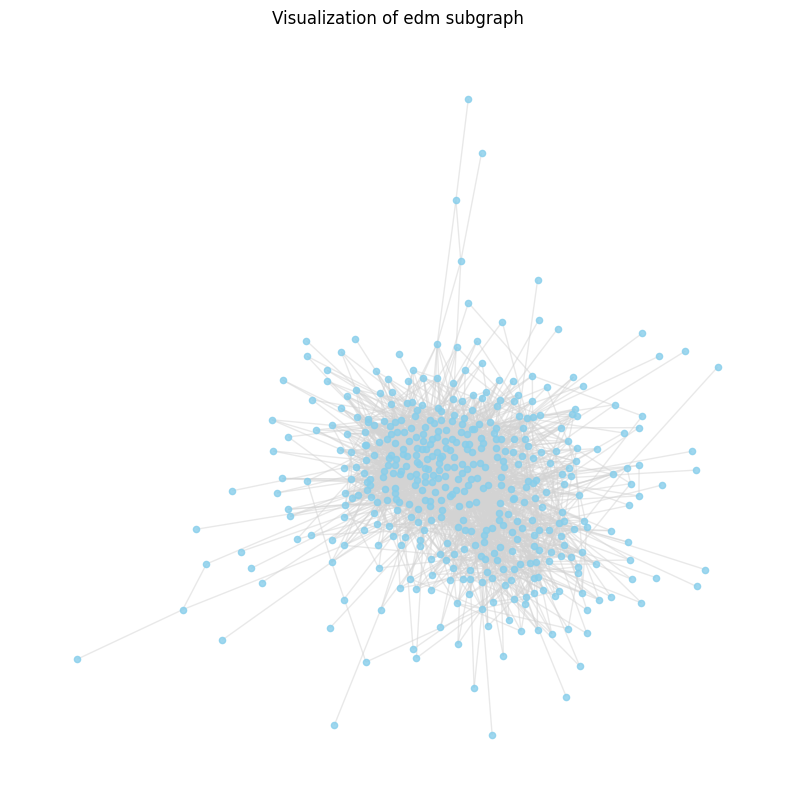

pop dance - Total nodes: 378, Isolated nodes: 11, Isolated percentage: 2.91%

20 most connected artist(s) in pop dance by number of connections:
Artist: Tiësto, Connections: 88
Artist: David Guetta, Connections: 72
Artist: R3HAB, Connections: 71
Artist: Steve Aoki, Connections: 70
Artist: Armin van Buuren, Connections: 62
Artist: MOTi, Connections: 58
Artist: Dimitri Vegas & Like Mike, Connections: 57
Artist: Diplo, Connections: 51
Artist: Afrojack, Connections: 50
Artist: Hardwell, Connections: 48
Artist: Galantis, Connections: 47
Artist: Nicky Romero, Connections: 46
Artist: Sam Feldt, Connections: 44
Artist: Robin Schulz, Connections: 41
Artist: Becky Hill, Connections: 39
Artist: Clean Bandit, Connections: 39
Artist: Joel Corry, Connections: 39
Artist: Dillon Francis, Connections: 37
Artist: NERVO, Connections: 37
Artist: Martin Garrix, Connections: 37

Diameter for pop dance: 7
Global clustering for pop dance: 0.21238263110721203


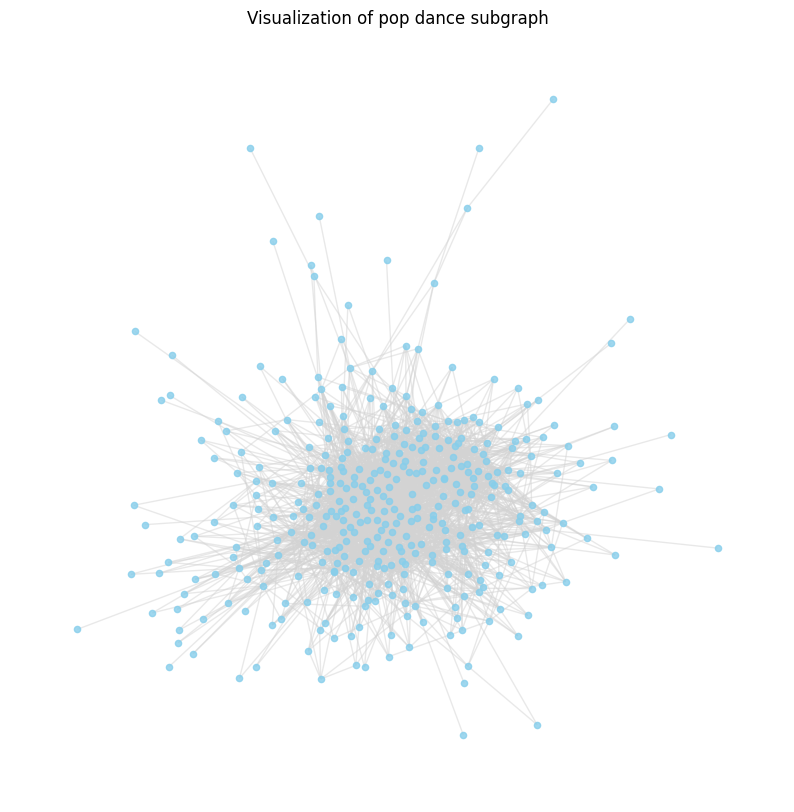

pop edm - Total nodes: 368, Isolated nodes: 94, Isolated percentage: 25.54%

20 most connected artist(s) in pop edm by number of connections:
Artist: Tritonal, Connections: 43
Artist: Cash Cash, Connections: 32
Artist: Sam Feldt, Connections: 32
Artist: Nicky Romero, Connections: 23
Artist: NERVO, Connections: 23
Artist: MOTi, Connections: 22
Artist: Matoma, Connections: 18
Artist: TELYKast, Connections: 16
Artist: GATTÜSO, Connections: 15
Artist: The Him, Connections: 14
Artist: Borgeous, Connections: 14
Artist: Shaun Frank, Connections: 13
Artist: San Holo, Connections: 13
Artist: Thomas Gold, Connections: 13
Artist: Mike Williams, Connections: 13
Artist: Lucas & Steve, Connections: 13
Artist: Jay Hardway, Connections: 13
Artist: Vicetone, Connections: 12
Artist: Elephante, Connections: 12
Artist: Lost Kings, Connections: 12

Diameter for pop edm: 10
Global clustering for pop edm: 0.11298989371313631


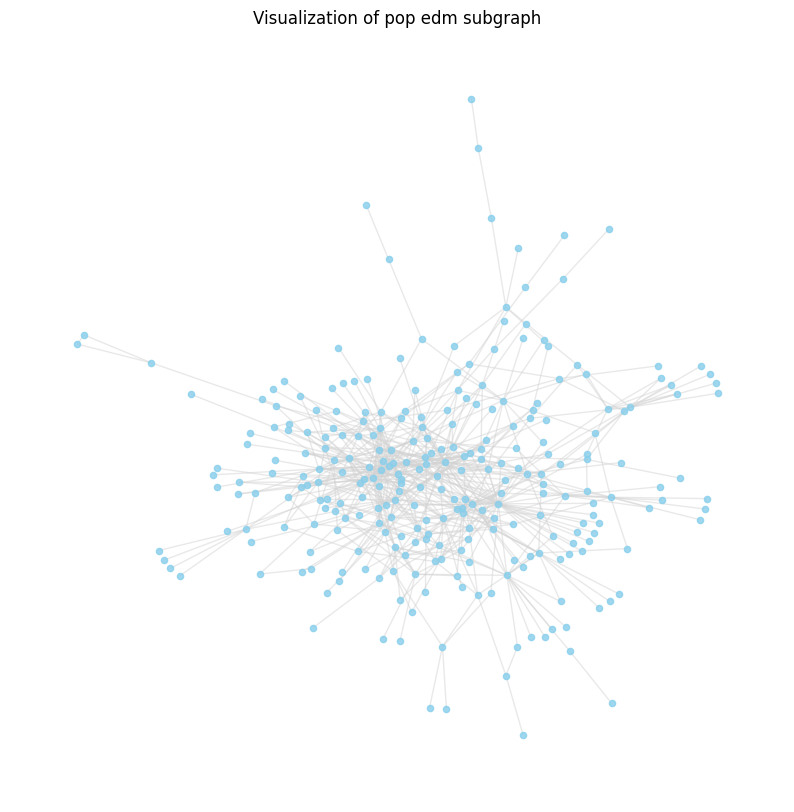

filmi - Total nodes: 351, Isolated nodes: 13, Isolated percentage: 3.70%

20 most connected artist(s) in filmi by number of connections:
Artist: A.R. Rahman, Connections: 115
Artist: Pritam, Connections: 111
Artist: Yuvan Shankar Raja, Connections: 92
Artist: Shankar Mahadevan, Connections: 76
Artist: Shankar-Ehsaan-Loy, Connections: 73
Artist: G. V. Prakash, Connections: 73
Artist: Shreya Ghoshal, Connections: 72
Artist: Hariharan, Connections: 68
Artist: Devi Sri Prasad, Connections: 66
Artist: Sukhwinder Singh, Connections: 65
Artist: Vishal-Shekhar, Connections: 64
Artist: Himesh Reshammiya, Connections: 62
Artist: Amit Trivedi, Connections: 59
Artist: Arijit Singh, Connections: 59
Artist: Mika Singh, Connections: 55
Artist: Sunidhi Chauhan, Connections: 53
Artist: Benny Dayal, Connections: 53
Artist: Udit Narayan, Connections: 51
Artist: Alka Yagnik, Connections: 51
Artist: Neeti Mohan, Connections: 50

Diameter for filmi: 5
Global clustering for filmi: 0.3990999018972658


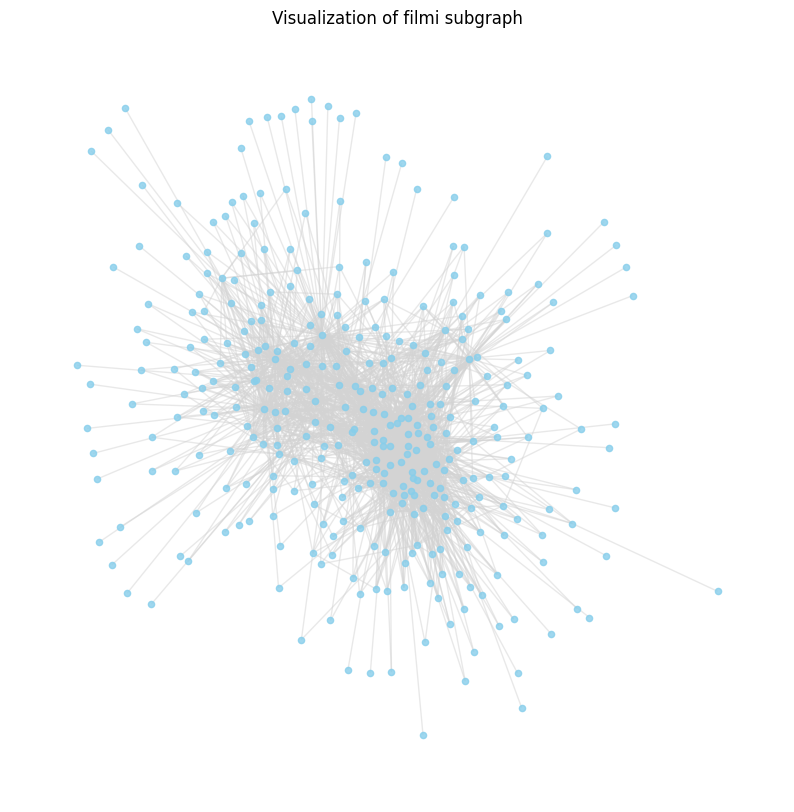

country - Total nodes: 194, Isolated nodes: 48, Isolated percentage: 24.74%

20 most connected artist(s) in country by number of connections:
Artist: Blake Shelton, Connections: 21
Artist: Dolly Parton, Connections: 18
Artist: Brad Paisley, Connections: 16
Artist: Thomas Rhett, Connections: 16
Artist: Miranda Lambert, Connections: 13
Artist: Kenny Chesney, Connections: 12
Artist: Tim McGraw, Connections: 11
Artist: Dierks Bentley, Connections: 11
Artist: HARDY, Connections: 10
Artist: Jason Aldean, Connections: 10
Artist: Keith Urban, Connections: 10
Artist: Chris Young, Connections: 9
Artist: Zac Brown Band, Connections: 9
Artist: Josh Turner, Connections: 9
Artist: Kenny Rogers, Connections: 8
Artist: Florida Georgia Line, Connections: 8
Artist: BRELAND, Connections: 8
Artist: Lady A, Connections: 8
Artist: Brantley Gilbert, Connections: 8
Artist: Little Big Town, Connections: 8

Diameter for country: 8
Global clustering for country: 0.11736055565712428


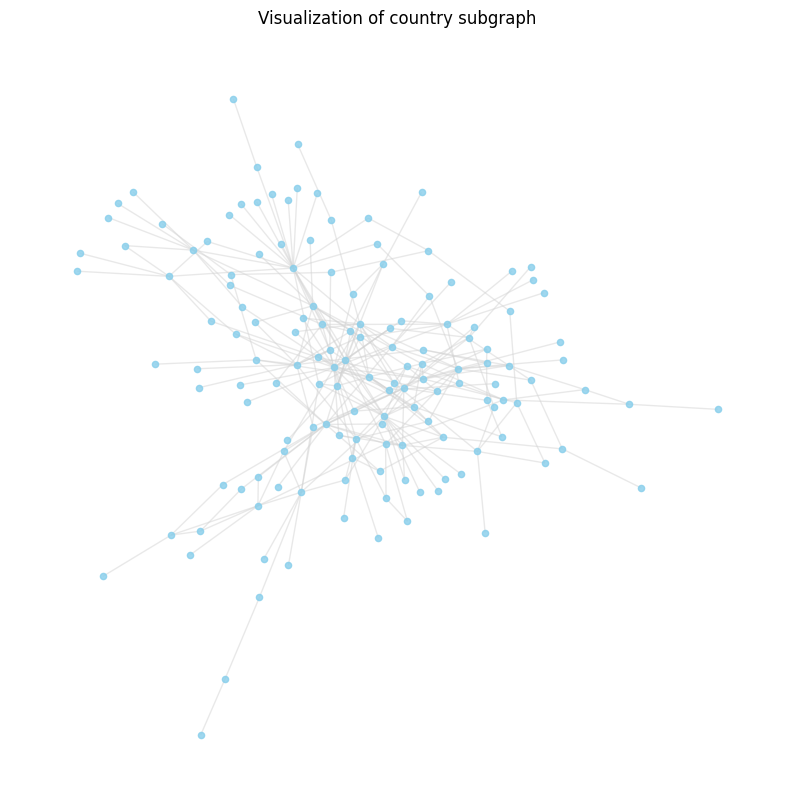

funk carioca - Total nodes: 349, Isolated nodes: 20, Isolated percentage: 5.73%

20 most connected artist(s) in funk carioca by number of connections:
Artist: MC Ryan SP, Connections: 72
Artist: Mc Gw, Connections: 68
Artist: Mc Don Juan, Connections: 63
Artist: DENNIS, Connections: 61
Artist: Mc Lele JP, Connections: 55
Artist: MC Marks, Connections: 54
Artist: Mc Davi, Connections: 52
Artist: MC Kevin o Chris, Connections: 52
Artist: MC Hariel, Connections: 50
Artist: MC Joãozinho VT, Connections: 49
Artist: Dj Batata, Connections: 48
Artist: Mc Kevin, Connections: 47
Artist: MC Menor da VG, Connections: 45
Artist: WC no Beat, Connections: 41
Artist: Mc IG, Connections: 41
Artist: Gaab, Connections: 40
Artist: MC Lan, Connections: 39
Artist: Mc Dricka, Connections: 38
Artist: Pk, Connections: 37
Artist: MC Kekel, Connections: 34

Diameter for funk carioca: 6
Global clustering for funk carioca: 0.2833120931035262


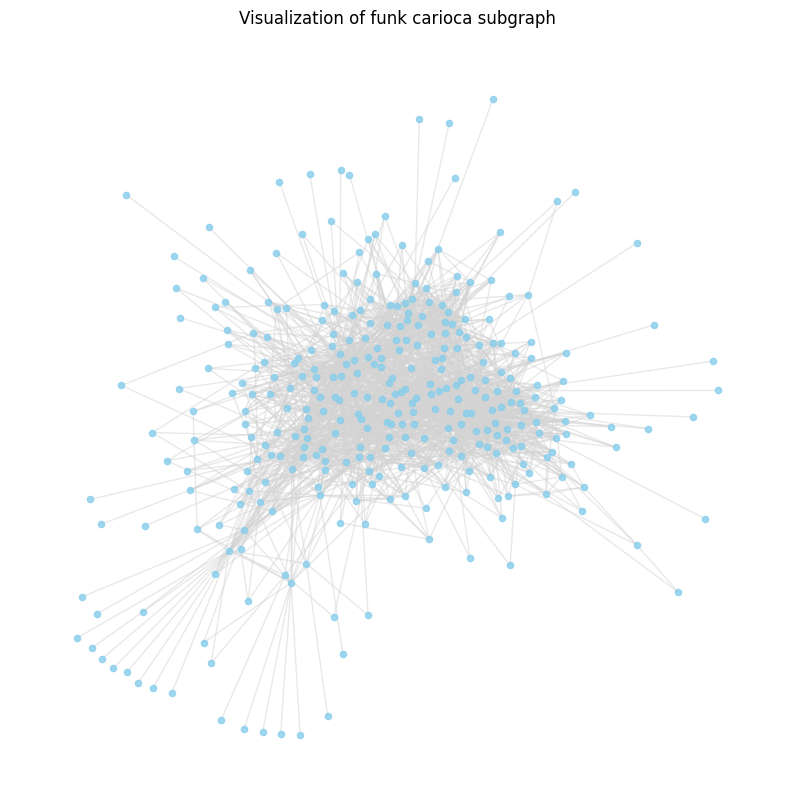

jazz - Total nodes: 74, Isolated nodes: 64, Isolated percentage: 86.49%

20 most connected artist(s) in jazz by number of connections:
Artist: Pat Metheny, Connections: 5

Diameter for jazz: 2
Global clustering for jazz: 0.0


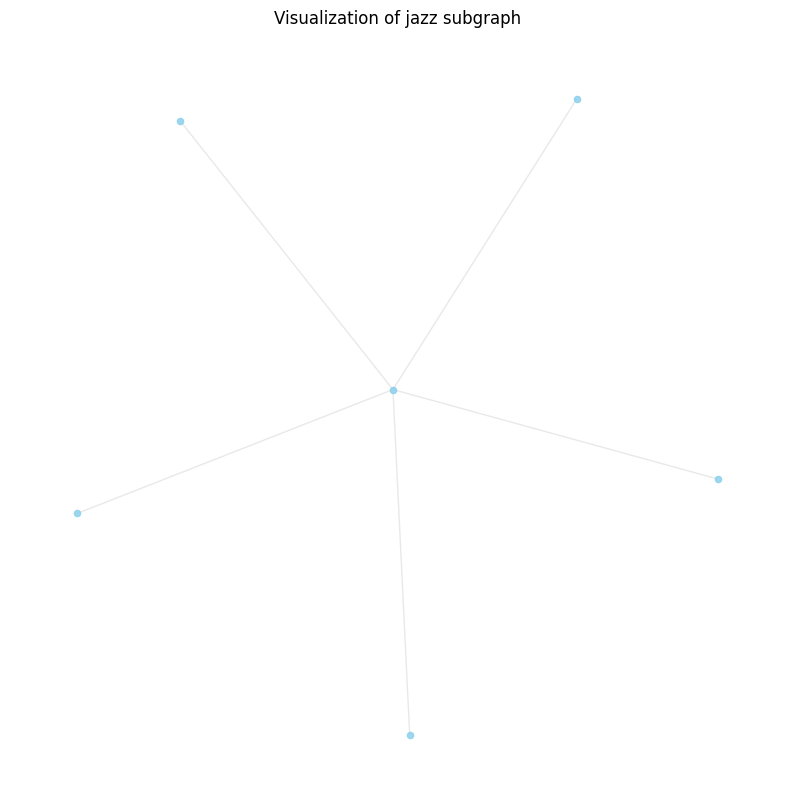

In [19]:
# runtime 5s

# define the genres to analyze:
selected_genres = ['pop', 'electro house', 'dance pop', 'pop dance', 'edm', 'pop edm', 'rap', 'r&b', 'hip hop', 'german hip hop', 
                   'uk pop', 'french hip hop', 'funk carioca', 'filmi', 'country', 'jazz', 'tropical house']

# build genre subgraphs for selected genres:
genre_subgraphs = {}
for node, data in G.nodes(data=True):
    if 'genres' in data:
        for genre in data['genres']:
            if genre in selected_genres:
                if genre not in genre_subgraphs:
                    genre_subgraphs[genre] = []
                genre_subgraphs[genre].append(node)

# calculate isolated nodes & create subgraphs for each selected genre:
for genre, nodes in genre_subgraphs.items():
    subgraph = G.subgraph(nodes).copy()

    # calculate isolated nodes and percentage:
    isolated_nodes = list(nx.isolates(subgraph))
    num_isolated = len(isolated_nodes)
    total_nodes = subgraph.number_of_nodes()
    isolated_percentage = (num_isolated / total_nodes) * 100 if total_nodes > 0 else 0
    print(f"{genre} - Total nodes: {total_nodes}, Isolated nodes: {num_isolated}, Isolated percentage: {isolated_percentage:.2f}%")

    # remove isolated nodes & find largest connected component:
    subgraph.remove_nodes_from(isolated_nodes)
    if nx.is_connected(subgraph):
        largest_cc = subgraph
    else:
        largest_cc = max(nx.connected_components(subgraph), key=len)
        largest_cc = subgraph.subgraph(largest_cc).copy()

    # find top 20 artists by degree in the largest connected component:
    top_20_artists = sorted(largest_cc.degree, key=lambda x: x[1], reverse=True)[:20]
    print(f"\n20 most connected artist(s) in {genre} by number of connections:")
    for artist, degree in top_20_artists:
        if degree > 1: # don't include "top artists" with no collaborations
            artist_name = G.nodes[artist].get('name', 'Unknown')
            print(f"Artist: {artist_name}, Connections: {degree}")

    # find diameter & global clustering for each genre's largest cluster:
    subgraph_diameter = nx.diameter(largest_cc)
    print(f"\nDiameter for {genre}: {subgraph_diameter}")
    subgraph_clustering = nx.average_clustering(largest_cc)
    print(f"Global clustering for {genre}: {subgraph_clustering}")

    # visualize only the largest connected component if it has more than one node:
    if largest_cc.number_of_nodes() > 1:
        visualize_genre_subgraph(largest_cc, genre)

A closer look at jazz, uk pop, and r&b:

Number of artists in uk pop: 406


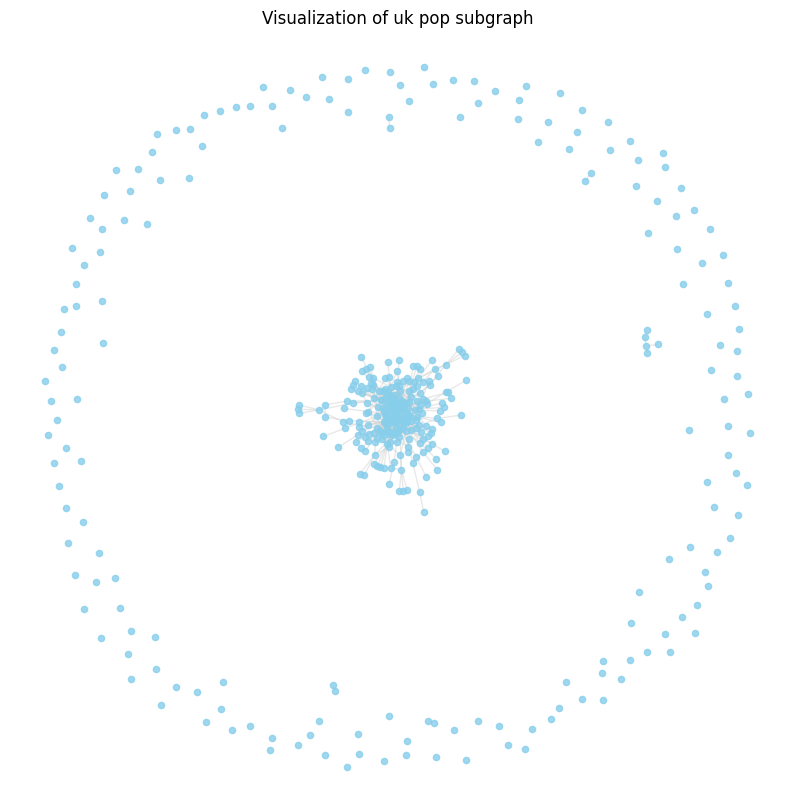

Number of artists in r&b: 299


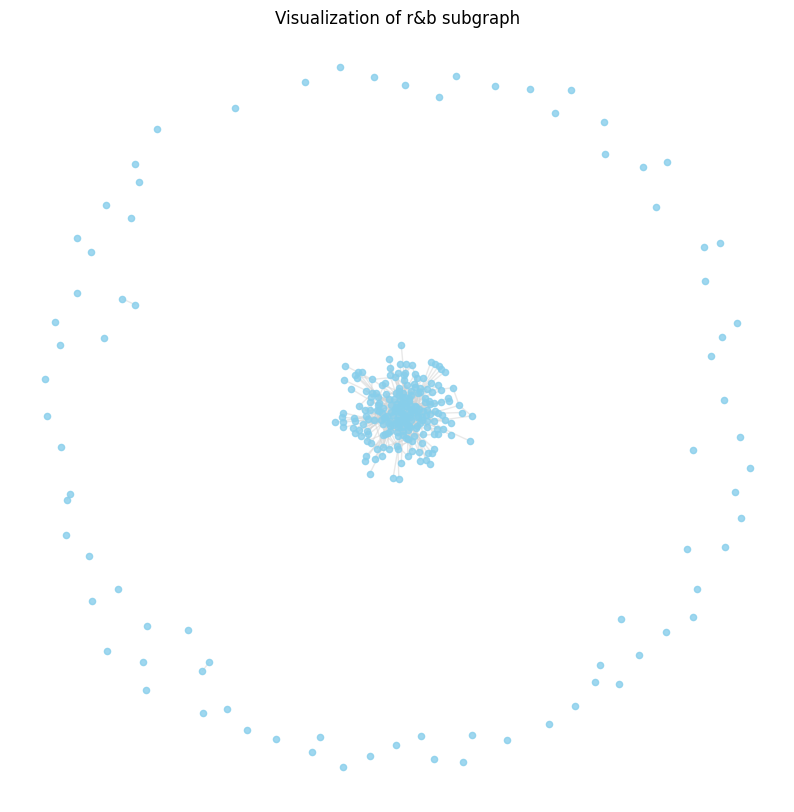

Number of artists in jazz: 74


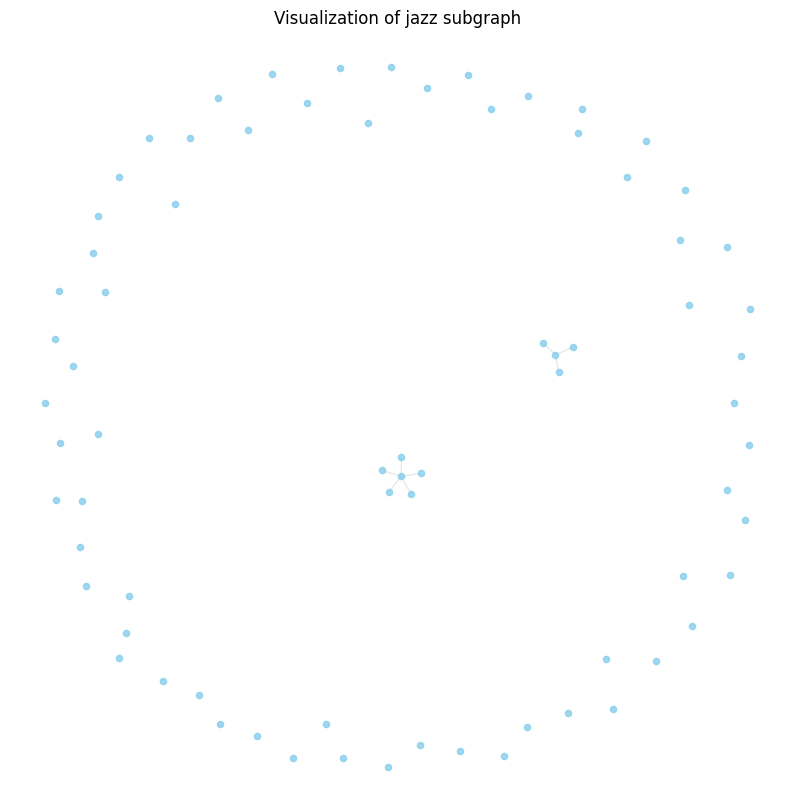


Those two most connected artists in jazz:
Artist: Pat Metheny, Connections: 5
Pat Metheny collaborated with: John Scofield, Ornette Coleman, Brad Mehldau, Charlie Haden, Dave Liebman

Artist: Kurt Elling, Connections: 3
Kurt Elling collaborated with: Miguel Zenón, Branford Marsalis, Marquis Hill



In [20]:
# runtime 0s

selected_genres = ['r&b', 'uk pop', 'jazz']

genre_subgraphs = {}
for node, data in G.nodes(data=True):
    if 'genres' in data:
        for genre in data['genres']:
            if genre in selected_genres:
                if genre not in genre_subgraphs:
                    genre_subgraphs[genre] = []
                genre_subgraphs[genre].append(node)

# create entire subgraphs for each selected genre:
for genre, nodes in genre_subgraphs.items():
    subgraph = G.subgraph(nodes).copy()
    print(f"Number of artists in {genre}: {subgraph.number_of_nodes()}")
    visualize_genre_subgraph(subgraph, genre)

    if genre == 'jazz':
        top_5_artists = sorted(subgraph.degree, key=lambda x: x[1], reverse=True)[:3]
        print(f"\nThose two most connected artists in {genre}:")
        for artist, degree in top_5_artists:
            if degree > 1:
                artist_name = subgraph.nodes[artist].get('name', 'Unknown')
                print(f"Artist: {artist_name}, Connections: {degree}")
                collaborators = [subgraph.nodes[neighbor].get('name', 'Unknown') for neighbor in subgraph.neighbors(artist)]
                print(f"{artist_name} collaborated with: {', '.join(collaborators)}\n")

Number of nodes in less popular artists subgraph: 105683
Number of edges in less popular artists subgraph: 12553


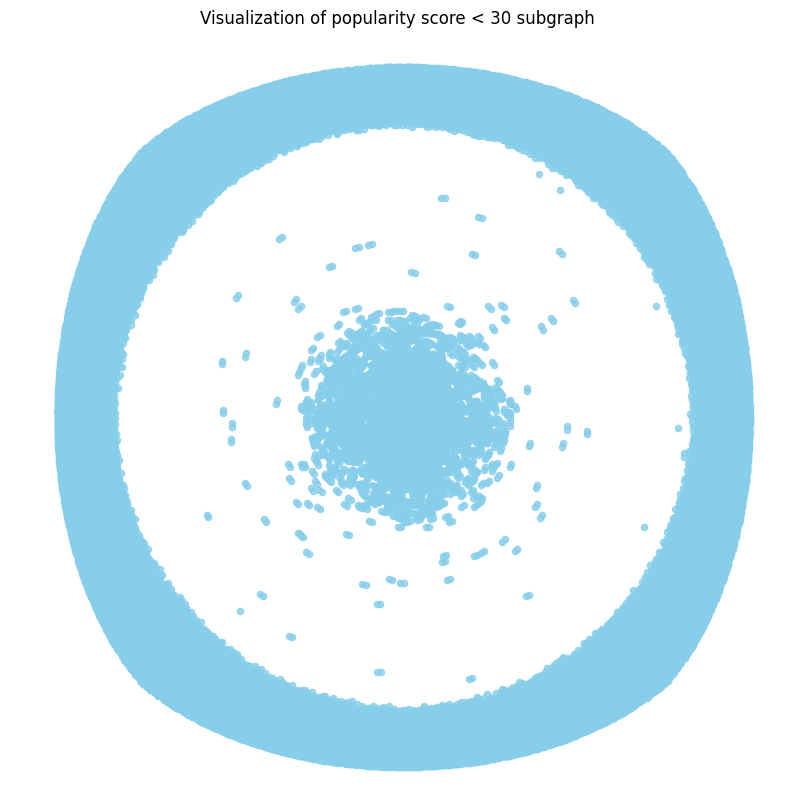

In [21]:
# runtime 131min

# Set a popularity threshold
popularity_max = 30

# Filter nodes based on popularity
less_popular_artists = [node for node, data in G.nodes(data=True) if data.get('popularity', 0) < popularity_max]
less_popular_subgraph = G.subgraph(less_popular_artists).copy()

# Visualize or analyze the popular subgraph as needed
print(f"Number of nodes in less popular artists subgraph: {less_popular_subgraph.number_of_nodes()}")
print(f"Number of edges in less popular artists subgraph: {less_popular_subgraph.number_of_edges()}")

visualize_genre_subgraph(less_popular_subgraph, 'popularity score < 30')

Number of nodes in popular artists subgraph: 933
Number of edges in popular artists subgraph: 7282


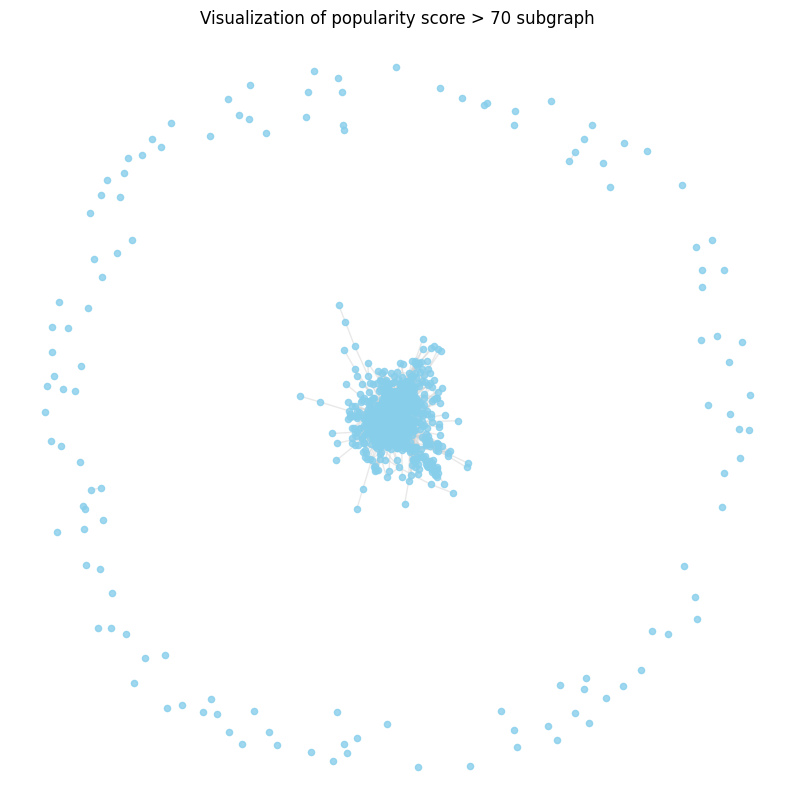

In [22]:
# runtime 3s

# Set a popularity threshold
popularity_threshold = 70

# Filter nodes based on popularity
popular_artists = [node for node, data in G.nodes(data=True) if data.get('popularity', 0) > popularity_threshold]
popular70_subgraph = G.subgraph(popular_artists).copy()

# Visualize or analyze the popular subgraph as needed
print(f"Number of nodes in popular artists subgraph: {popular70_subgraph.number_of_nodes()}")
print(f"Number of edges in popular artists subgraph: {popular70_subgraph.number_of_edges()}")

visualize_genre_subgraph(popular70_subgraph, 'popularity score > 70')

Number of nodes in popular artists subgraph: 403
Number of edges in popular artists subgraph: 3123


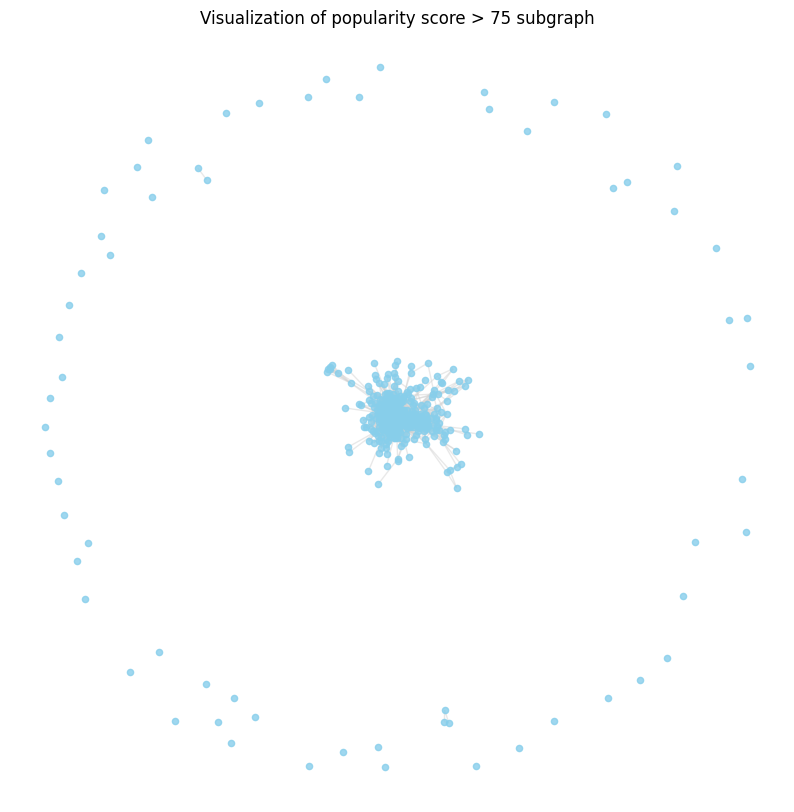

In [23]:
# Set a popularity threshold
popularity_threshold = 75

# Filter nodes based on popularity
popular_artists = [node for node, data in G.nodes(data=True) if data.get('popularity', 0) > popularity_threshold]
popular75_subgraph = G.subgraph(popular_artists).copy()

# Visualize or analyze the popular subgraph as needed
print(f"Number of nodes in popular artists subgraph: {popular75_subgraph.number_of_nodes()}")
print(f"Number of edges in popular artists subgraph: {popular75_subgraph.number_of_edges()}")

visualize_genre_subgraph(popular75_subgraph, 'popularity score > 75')

In [24]:
# calculate degree threshold (top 5%):
degrees = [degree for node, degree in G.degree()]
degree_threshold = np.percentile(degrees, 95)  # 95th percentile

# select nodes with a degree above the threshold:
high_degree_nodes = [node for node, degree in G.degree() if degree > degree_threshold]

# create the subgraph with only high-degree nodes:
high_degree_subgraph = G.subgraph(high_degree_nodes).copy()

# output # of nodes/edges:
print(f"Number of nodes in high-degree subgraph: {high_degree_subgraph.number_of_nodes()}")
print(f"Number of edges in high-degree subgraph: {high_degree_subgraph.number_of_edges()}")


Number of nodes in high-degree subgraph: 7533
Number of edges in high-degree subgraph: 67160


***Applying the Louvain algorithm for community detection:***

In [25]:
partition = community_louvain.best_partition(high_degree_subgraph)

# Group nodes by community
community_groups = defaultdict(list)
for node, community_id in partition.items():
    community_groups[community_id].append(node)

Artists in Community 45:
- Toby Romeo
- Dave Till
- NEEDTOBREATHE
- Big Narstie
- Lovespeake
- Julia Michaels
- James Blunt
- Vini Vici
- Sorana
- Snakehips
- Autoerotique
- JP Cooper
- Wax
- Bastille
- MIKA
- Calvin Harris
- Jason Rooney
- Nashville Cast
- Stace Cadet
- BLR
- Eden Prince
- Foster The People
- Marc Stout
- Anjulie
- Chase & Status
- Chilly Gonzales
- James Carter
- Rudeejay
- Death Cab for Cutie
- Maisie Peters
- Arem Ozguc
- Emma Louise
- Chris Malinchak
- Achtabahn
- Måns Zelmerlöw
- Gerd Janson
- Pell
- U2
- Sem Thomasson
- Mike Williams
- Peking Duk
- Era Istrefi
- Carly Rae Jepsen
- James Arthur
- Surf Mesa
- Dido
- Bebe Rexha
- Axwell
- blackbear
- Glass Animals
- DJ Zinc
- Tchami
- Arman Aydin
- Raven & Kreyn
- Vanic
- Timeflies
- Chromeo
- BB Team
- MOUNT
- Miike Snow
- Like Mike
- Tujamo
- FTampa
- Rowen Reecks
- Lights
- Herve Pagez
- Robin Schulz
- Chris Burke
- Dimitri Vegas
- Albin Johnsén
- End of the World
- The Wanted
- PBH & JACK
- Lulleaux
- Imanbek
-

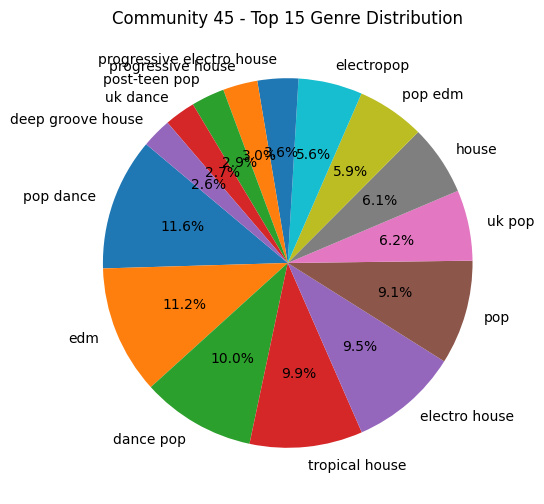

Average clustering coefficient for Community 45: 0.11344190269780963


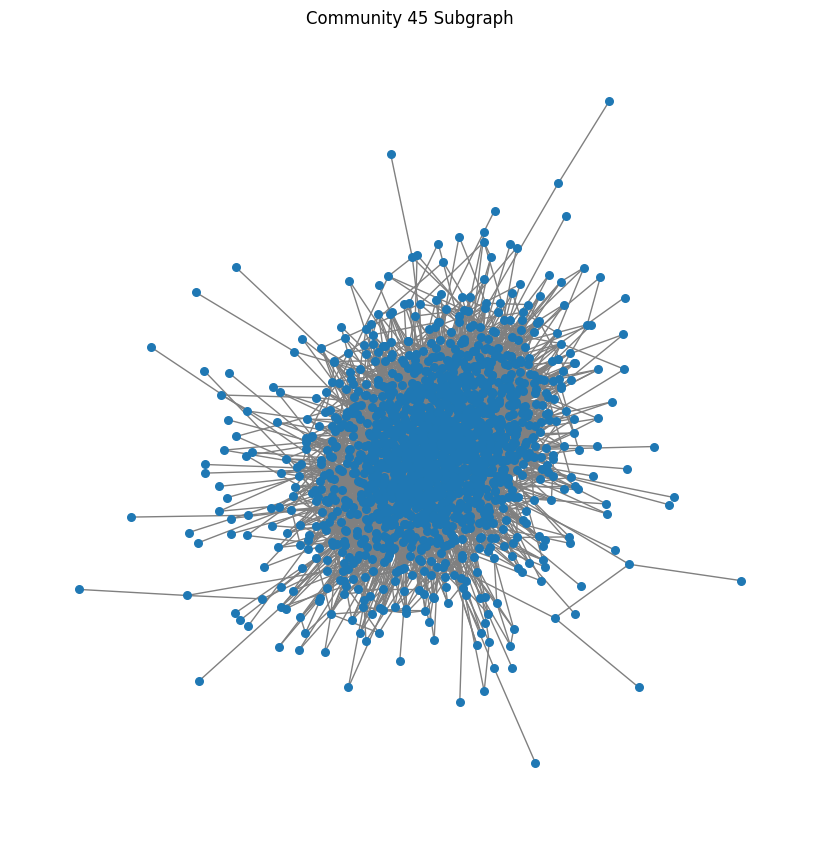

Artists in Community 4:
- Selecta
- The Halluci Nation
- Héctor Acosta "El Torito"
- KURT
- Nico Mastre
- Ayax y Prok
- C-Kan
- Shakira
- El Jhota
- Nibal
- El Mimoso Luis Antonio López
- Shelow Shaq
- Felipe Peláez
- Bulin 47
- Muerejoven
- Lao Ra
- Haraca Kiko
- The Rudeboyz
- Grupo Arriesgado
- Ana Torroja
- El Jincho
- Espinoza Paz
- Edu Lombardo
- Diego Torres
- Robledo
- Gabriela Rocha
- El Fecho RD
- Carla Morrison
- Black Jonas Point
- Blaiz Fayah
- Brytiago
- Milly
- Delaossa
- Danny Ocean
- Moncho Chavea
- Malú
- Juanes
- The La Planta
- El Komander
- Eva Ayllón
- Marco Antonio Solís
- Alvaro Rod
- MC Davo
- BCA
- Breakfast n Vegas
- Falsetto
- Juancho Marqués
- Osmani Garcia "La Voz"
- La Materialista
- Jessi Uribe
- Lira
- Gailen La Moyeta
- Pedro Capó
- Mon Laferte
- Gatillero 23
- Jorge Drexler
- FlowZeta
- Bizarrap
- Yung Beef
- Nicole Favre
- BARBEL
- Neo Pistea
- Jey Blessing
- Leonel García
- Jona Mix
- Bulova
- No Te Va Gustar
- Victor Jara
- Alex Sensation
- Dowba M

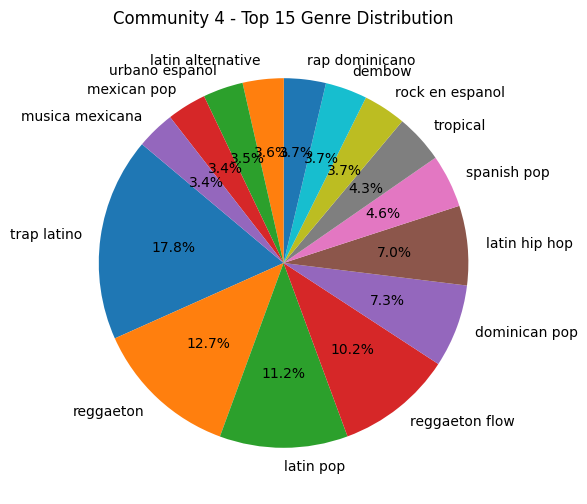

Average clustering coefficient for Community 4: 0.27472797390718884


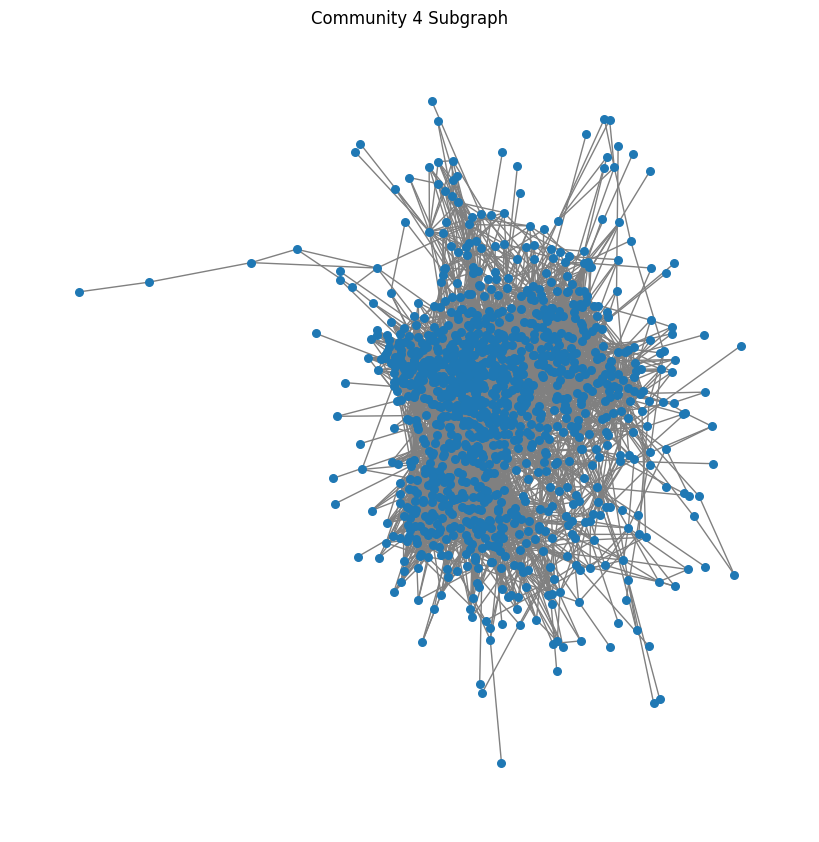

Artists in Community 102:
- Tyler Bates
- Vybz Kartel
- Internet Money
- The Game
- M.I.A.
- Marc E. Bassy
- Khalid
- Eastside Jody
- Capella Grey
- Mariah Carey
- Sizzla
- The Temptations
- Childish Gambino
- Jaden
- Yemi Alade
- VaVa
- kizaru
- Swae Lee
- Lil Baby
- DJ Khaled
- Machel Montano
- DJ Polique
- Little Dragon
- Migos
- Danny Wolf
- Trae Tha Truth
- Mura Masa
- Don Toliver
- Killer Mike
- Smino
- Emiway Bantai
- SWV
- Freddie Gibbs
- Maroon 5
- Kool G Rap
- Tom. G
- A$AP Rocky
- Danny Elfman
- Ab-Soul
- Idina Menzel
- Roy Woods
- Yeat
- Abrina
- O.T. Genasis
- Mel Tormé
- YG
- Lucy Rose
- Fetty Wap
- Stevie Nicks
- Buddy
- Timbaland
- Elephant Man
- YNW Melly
- 03 Greedo
- Anthony Hamilton
- Louis Armstrong
- Madonna
- Raekwon
- Dreamville
- Common
- Eve
- Salt-N-Pepa
- Gustixa
- Nils Frahm
- Simple Plan
- Hudson Mohawke
- Ray J
- Lucky Daye
- Iyanya
- AI
- Fergie
- Talib Kweli
- Eric Clapton
- Tech N9ne
- Brantley Gilbert
- Jessica Simpson
- Trina
- Capital Cities
- NAV
-

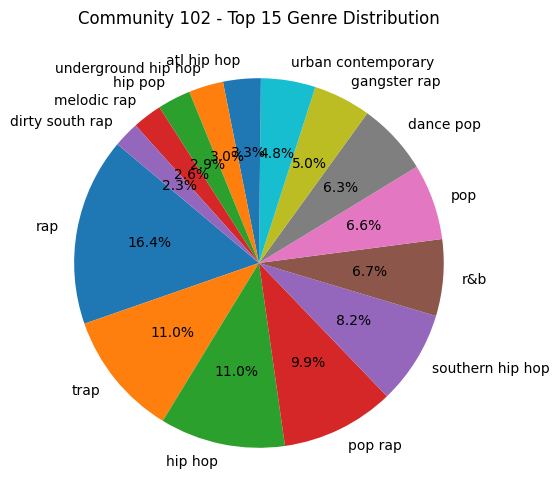

Average clustering coefficient for Community 102: 0.23613071205859984


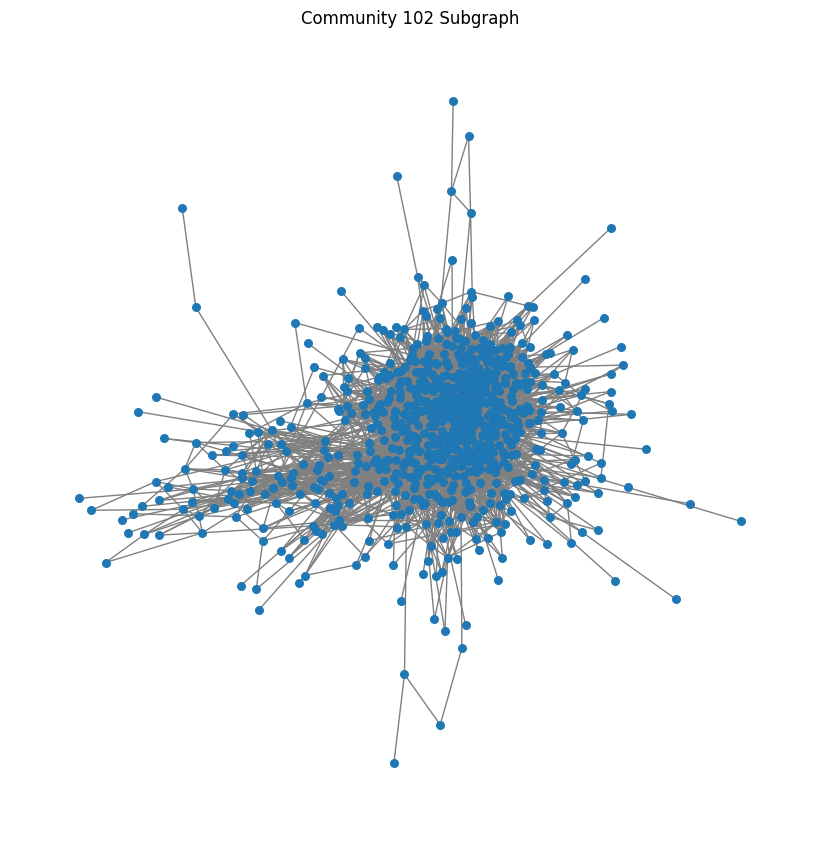

Artists in Community 1:
- MC Guime
- DJ Will22
- DJ Roca
- Mc Bola
- Plutonio
- Ivete Sangalo
- Henrique & Diego
- MC G15
- MC Mazzie
- Tribo da Periferia
- Os Cretinos
- Mc 2k
- João Bosco & Vinicius
- João Neto & Frederico
- MC Menor da VG
- DJ Zullu
- Mc Anônimo
- Belo
- Sara Carreira
- Petter Ferraz
- Day e Lara
- Orange Grove
- Luan Estilizado
- Carlão
- MC Flavinho
- Jeff Costa
- António Zambujo
- Mc João
- Vitinho Imperador
- BK
- Dynho Alves
- DJ GRZS
- Felipe Original
- MC Pipokinha
- MC Duartt
- Loubet
- Salvador Da Rima
- Gustavo Mioto
- MC Zaquin
- Papatinho
- Silva
- Jefferson Moraes
- Mc Anjim
- Deejay Telio
- Gabriel Diniz
- DJ 900
- Jonas Esticado
- Mc Frog
- MC Meno K
- DJ VILÃO
- Criolo
- EME
- Selminho DJ
- IZA
- Maiara & Maraisa
- MC Madan
- Regula
- Mc 7 Belo
- Dyamante DJ
- MC Gui Andrade
- Pelé MilFlows
- SosMula
- Sandy
- Mac Júlia
- Two Maloka
- Djonga
- DJ Lucas Beat
- O Tubarão
- Leo Santana
- Tati Zaqui
- Dj Henrique de Ferraz
- FBC
- Kell Smith
- Tiago Bett

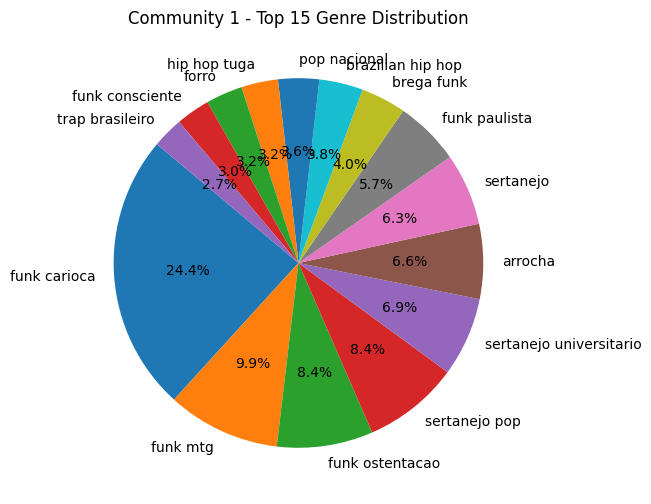

Average clustering coefficient for Community 1: 0.23563222562172248


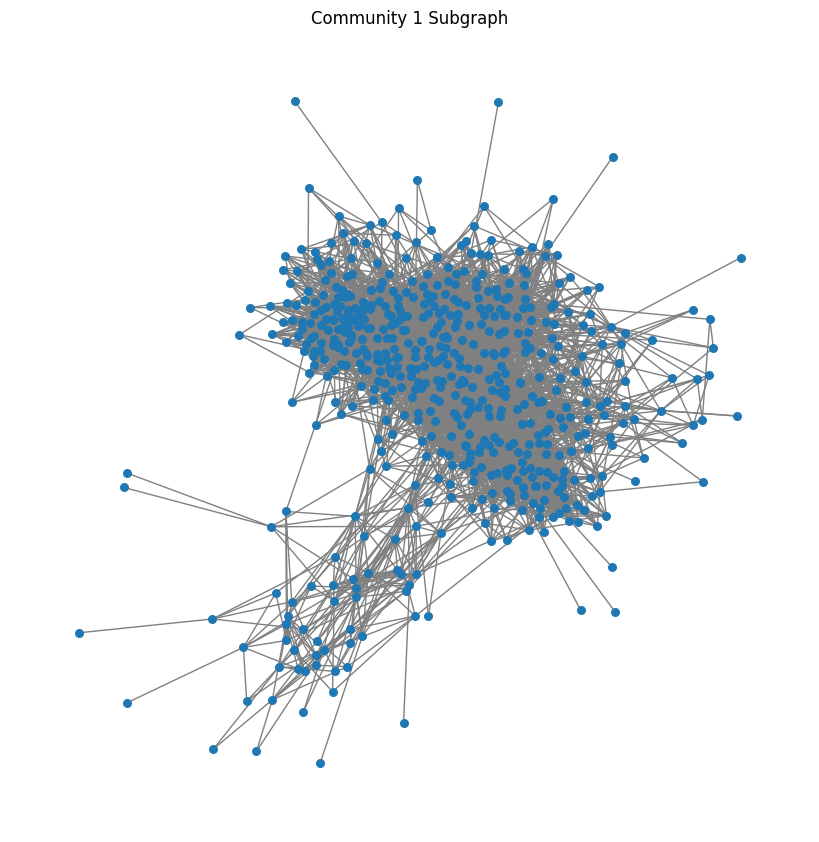

Artists in Community 26:
- Parokya Ni Edgar
- Vidi Aldiano
- Crush
- 大支
- Shota Shimizu
- Andiez
- Flow G
- URBOYTJ
- C JAMM
- Kelly Chen
- Hacken Lee
- Wonderframe
- The Company
- Khói
- Lipta
- SUPERBEE
- Mad Clown
- P-Hot
- KANGDANIEL
- starRo
- PUNPEE
- Khanh Phuong
- 空音
- Incognito
- pH-1
- Ovall
- Kiana V
- MILLI
- Leehom Wang
- Trong Hieu
- Angeline Quinto
- Gary Valenciano
- Pasto
- Rapital
- Namie Amuro
- CHANGMO
- Phuc Du
- Rad Museum
- Alan Kuo
- Tompi
- Saran
- Verbal Jint
- Jay Chou
- F.HERO
- Orange
- Andy Hui
- K6Y
- BUMKEY
- Michael Wong
- Kina Grannis
- Hồ Ngọc Hà
- CHEMISTRY
- Monkey Majik
- SonaOne
- Hoang Thuy Linh
- Trinh Thang Binh
- Kmy Kmo
- Binz
- Yovie Widianto
- Sunwoojunga
- John Roa
- WILYWNKA
- kZm
- Han Yo Han
- Christian Bautista
- Đen
- Darren Espanto
- FRαNKIE阿法
- Anthem Lights
- Megan Davies
- Dato' Sri Siti Nurhaliza
- Tiger JK
- CHAI
- Jacky Cheung
- Sik-K
- m-flo
- Andy Lau
- THAITANIUM
- Sandy Lam
- Miliyah
- K-ICM
- Khalil Fong
- YOUNGOHM
- Naim 

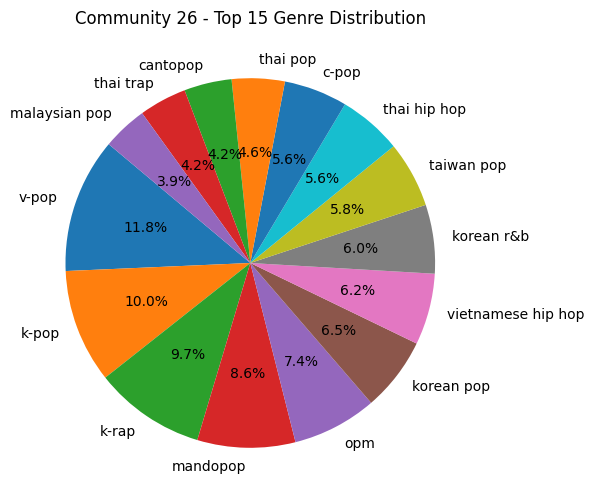

Average clustering coefficient for Community 26: 0.21087655355696472


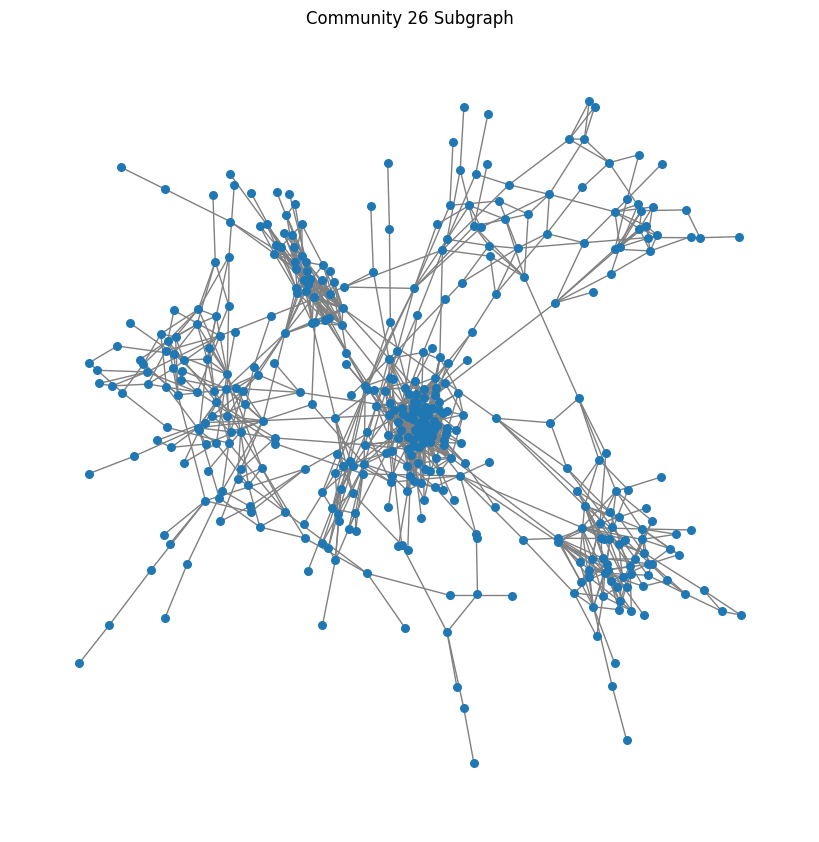

Artists in Community 6:
- KALIM
- Jan Delay
- Capo
- Ezhel
- Cem Adrian
- Hayki
- Ferhat Göçer
- Stereo Luchs
- Schwesta Ewa
- Anstandslos & Durchgeknallt
- Chakuza
- XATAR
- K.I.Z
- Haftbefehl
- Alpa Gun
- Veysel
- Seeed
- Ra'is
- Moe Phoenix
- Drunken Masters
- reezy
- Julien Bam
- Sansar Salvo
- Mimiks
- Eno
- RIN
- Andreas Gabalier
- Azad
- Ceylan Ertem
- Dabu Fantastic
- NKSN
- Ufo361
- BHZ
- Dhurata Dora
- Udo Lindenberg
- MoTrip
- Madeline Juno
- Serdar Ortaç
- Majoe
- SSIO
- Musa Eroğlu
- KitschKrieg
- Prinz Pi
- Mia Julia
- No.1
- Umut Timur
- Ati242
- Zuna
- Guts
- Genetikk
- Capital Bra
- Server Uraz
- Karate Andi
- Grogi
- Max Herre
- Jack Orsen
- Azzi Memo
- Killa Hakan
- Majk
- Mehmet Erdem
- Ado Kojo
- Samra
- Kalazh44
- Joker
- Nizi19
- DCVDNS
- Longus Mongus
- Sa4
- Navigator
- JAZN
- FOURTY
- Capital T
- Bossy
- MAJAN
- Selo
- Eypio
- Kezzo
- Clueso
- Falco
- SDP
- Koray Avcı
- Xavier Naidoo
- Milow
- Sugar MMFK
- Bligg
- EAZ
- Severina
- Behzat Gerçeker
- Keişan
- LE

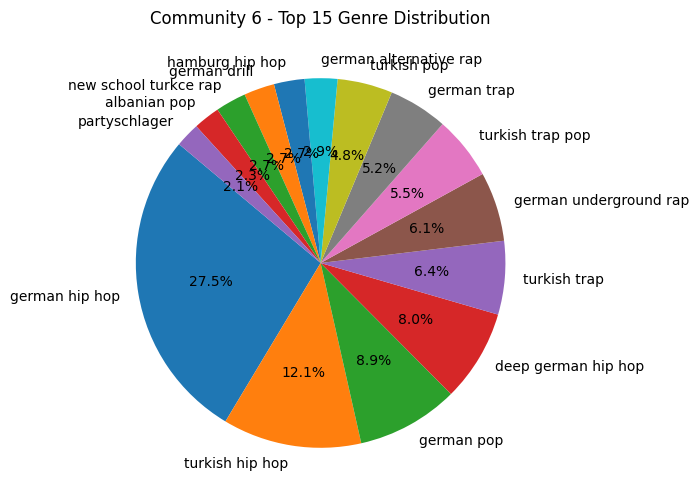

Average clustering coefficient for Community 6: 0.28462917869816456


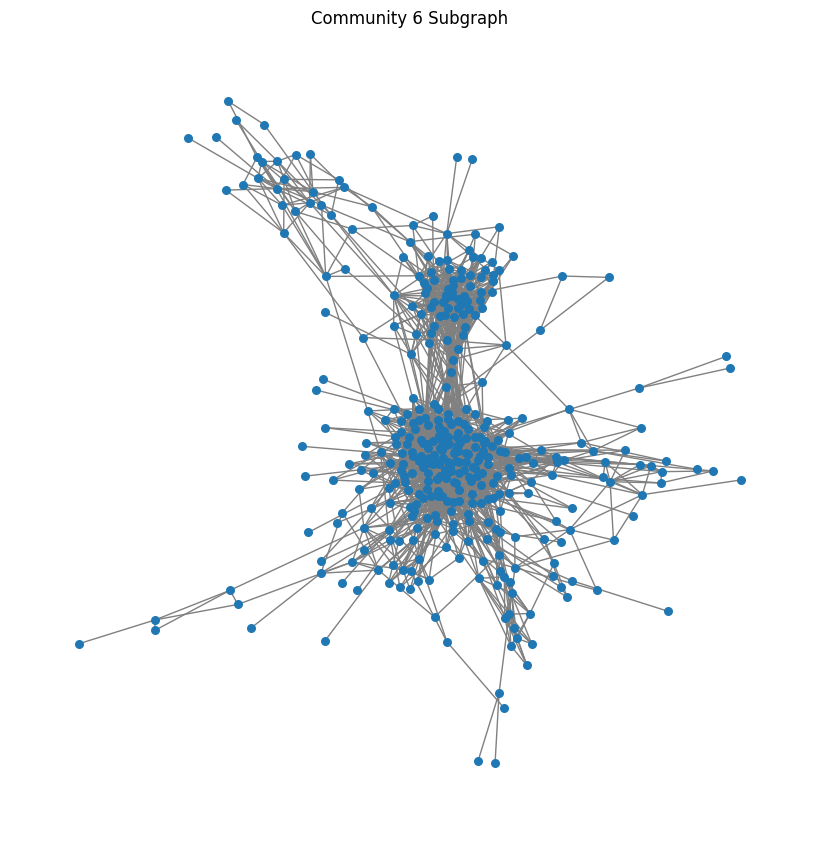

Artists in Community 89:
- BRVMSOO
- YL
- Kafon
- Kaaris
- Bigflo & Oli
- Moubarak
- Nahir
- Serge Ibaka
- Kore
- Luv Resval
- H Magnum
- Amel Bent
- Kaza
- Todiefor
- Heuss L'enfoiré
- Juicy P
- Imen Es
- Houari
- Hös Copperfield
- Julien Doré
- Hatik
- ISK
- Zkr
- Vitaa
- UZI
- Rohff
- Bilal Hassani
- Ateyaba
- Alrima
- Sneazzy
- Leto
- Dadinho
- DJ Kayz
- Jok'air
- Mister V
- Hayce Lemsi
- SCH
- 7liwa
- Chawki
- Jul
- Naza
- Coyote Jo Bastard
- Maska
- 91 All Stars
- GIMS
- Kool Shen
- Sadek
- Balti
- Bendo
- ASHE 22
- KeBlack
- Freeze corleone
- ElGrandeToto
- Lynda
- 100 Blaze
- Master Sina
- Osirus Jack
- Laylow
- Ikaz Boi
- DJ Erise
- Hiro
- Draganov
- Kendji Girac
- Alpha Wann
- Cheb Djalil
- VAN
- Aya Nakamura
- DJ Babs
- SAF
- DA Uzi
- Sam's
- Soolking
- Madd
- Chily
- Madame Monsieur
- Christophe
- Lacrim
- Lesram
- Cheb Mami
- Diib
- Ghost Killer Track
- Jahyanai
- Rim'K
- Naar
- Mac Tyer
- Nekfeu
- SDM
- Tawsen
- Charlotte Cardin
- Gros Mo
- Slimane
- Smallx
- Roméo Elvis


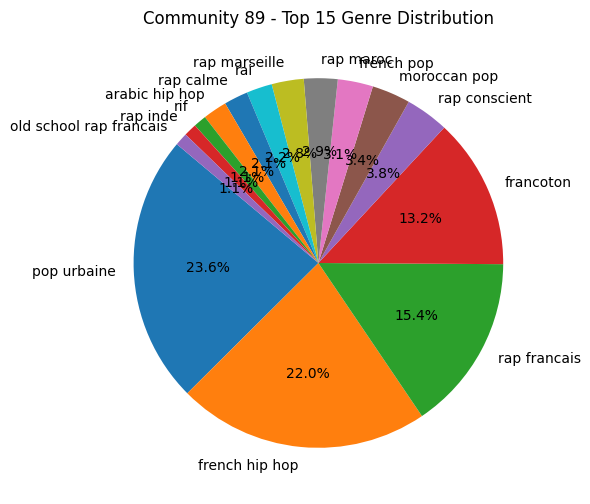

Average clustering coefficient for Community 89: 0.2678914776978556


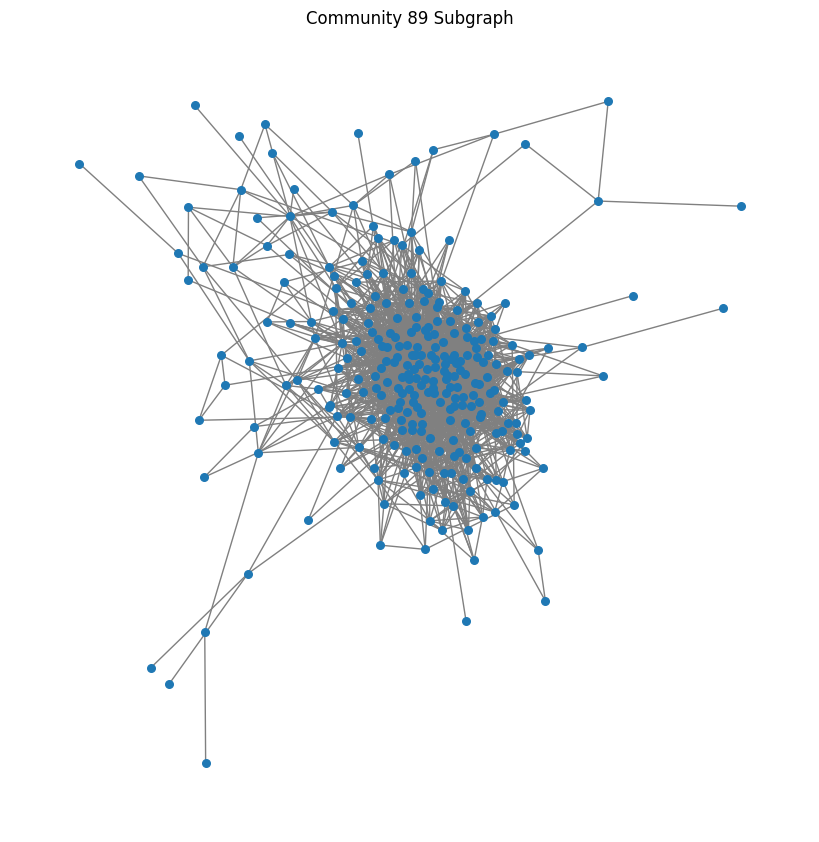

Artists in Community 20:
- Dargen D'Amico
- Enzo Dong
- Zucchero
- Freddy Quinn
- Bresh
- Massimo Pericolo
- Briga
- Stereoact
- Geolier
- Carmen Consoli
- Ex-Otago
- Max Pezzali
- Enrico Ruggeri
- Robert Miles
- Crookers
- Il Profeta
- Mecna
- Coez
- Patty Pravo
- Dardust
- DJ Matrix
- Linea 77
- GionnyScandal
- Loredana Bertè
- thasup
- Lele Blade
- Frenetik&Orang3
- Bambini Di Praga
- Radical
- Nashley
- Davide Shorty
- Edoardo Bennato
- Paky
- Anne Linnet
- Nerone
- Irama
- Eros Ramazzotti
- Shablo
- Lucio Dalla
- Baby K
- Ornella Vanoni
- Rancore
- Andrea Bocelli
- Vale pain
- Nayt
- Fedez
- London Symphony Orchestra
- Nitro
- Guè
- Irene Grandi
- Jovanotti
- Mahmood
- Clementino
- Franco126
- MV Killa
- Annalisa
- Vassendgutane
- Alexia
- Elisa
- Baby Gang
- Inoki
- Orietta Berti
- Don Joe
- Gemitaiz
- nan
- Moreno
- Franco Battiato
- Mostro
- Elodie
- Caparezza
- Jack The Smoker
- Tarja
- Sissel
- Luchè
- Ermal Meta
- Pino Daniele
- Jake La Furia
- Nobuo Uematsu
- Subsonica
- 2n

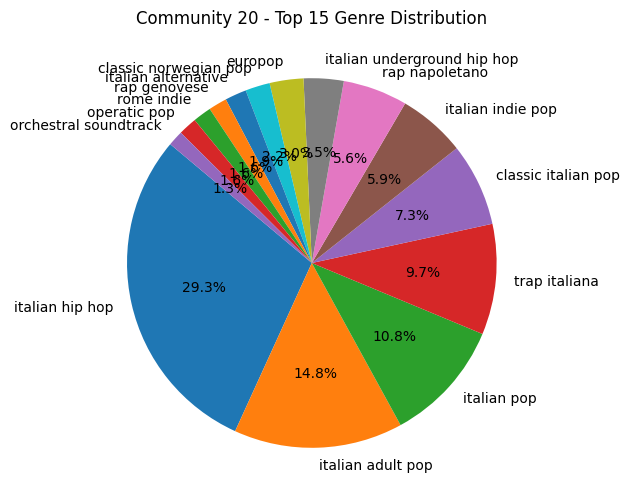

Average clustering coefficient for Community 20: 0.2546977367058151


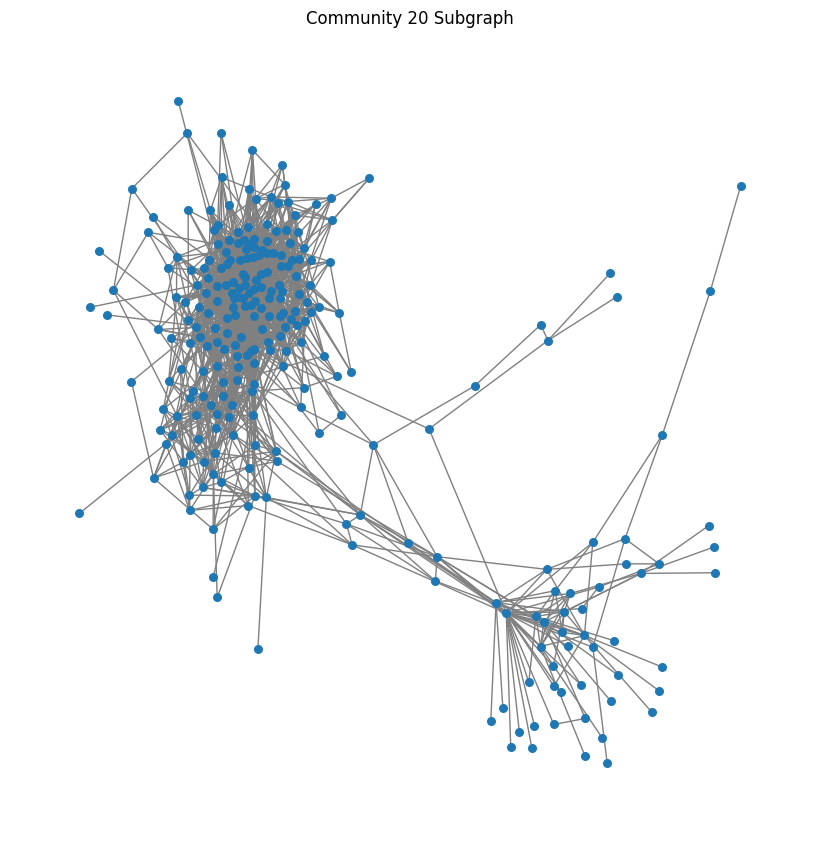

Artists in Community 0:
- Dopebwoy
- Bilal Wahib
- Jandro
- Fresku
- Kraantje Pappie
- Ismo
- Delivio Reavon
- Hansie
- Paul Sinha
- INAS
- Frsh
- Yung Felix
- Diggy Dex
- Anbu
- ICE
- Makkie
- Quessswho
- Jairzinho
- Feis
- Hussain Aljassmi
- Daniël Busser
- Chivv
- 3robi
- Bokoesam
- Mr. Polska
- Rashed Al-Majed
- Jermaine Niffer
- Idaly
- NAVI
- Jiri11
- DYSTINCT
- Geechi
- CJaye
- KA
- Jozo
- Lange Frans
- BKO
- Yung Internet
- Blow
- Figo Gang
- Spens
- Sef
- The Partysquad
- Kevin
- OCS
- Jayboogz
- Frenna
- Rolf Sanchez
- Nick & Simon
- Jack
- Rasskulz
- Spanker
- Artistic Raw
- Emms
- Jhorrmountain
- Rich2Gether
- Jay Jay
- Shaun Reynolds
- Ir Sais
- Tourist LeMC
- Fmg
- Lijpe
- Typhoon
- Sticks
- Leafs
- Yes-R
- Trobi
- 5NAPBACK
- Bully
- Team Rush Hour
- Tur-G
- Gerard Joling
- DODO
- Jordymone9
- Sam J'taime
- GLOWINTHEDARK
- The Boy Next Door
- Billy The Kit
- Kevcody
- Trijntje Oosterhuis
- Jebroer
- Keizer
- $hirak
- Ronnie Flex
- Broederliefde
- 3JS
- Brace
- Big2
- Rabb

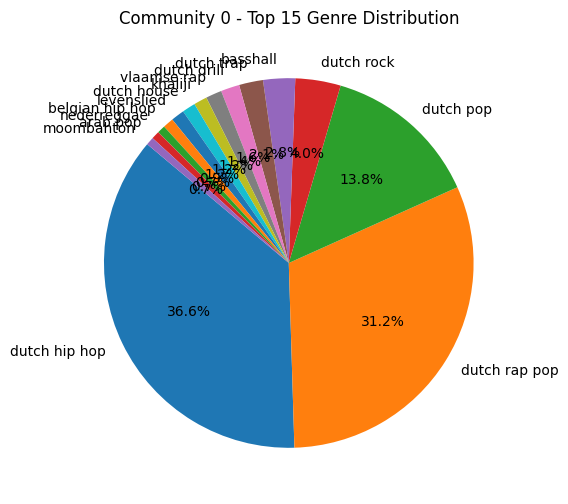

Average clustering coefficient for Community 0: 0.31898736335059386


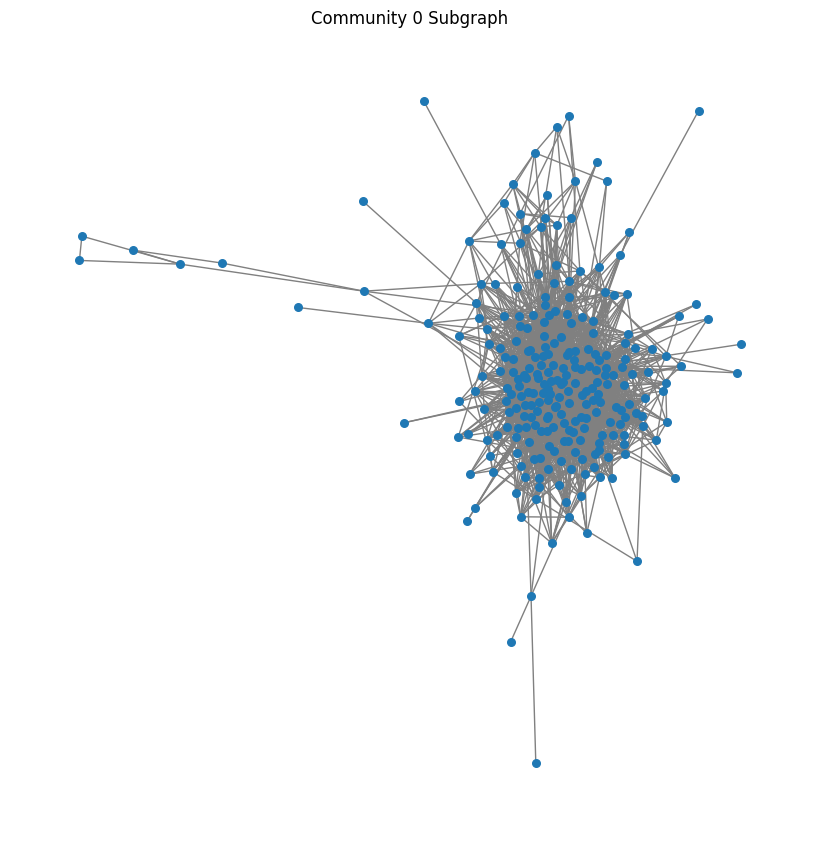

Artists in Community 12:
- Arko
- Adnan Sami
- Mithoon
- Shweta Mohan
- Sri Krishna
- Abhijit Vaghani
- Siddharth Basrur
- Raftaar
- James Newton Howard
- Anjjan
- Akhil
- Mamta Sharma
- Mankirt Aulakh
- Sachet-Parampara
- Intense
- Kanika Kapoor
- Javed Ali
- Metallica
- Dhibu Ninan Thomas
- Raj Ranjodh
- Zaeden
- Devi Sri Prasad
- Seedhe Maut
- Dj Chetas
- Santhosh Narayanan
- Jaz Dhami
- Sam C.S.
- Raghav
- Tanishk Bagchi
- Shankar Mahadevan
- Ranveer Singh
- Mohit Chauhan
- Meet Bros.
- Shaarib Toshi
- Ninja
- Abhay Jodhpurkar
- Akhil Sachdeva
- Abhijeet
- Neeraj Shridhar
- Amrita Singh
- G. V. Prakash
- Ash King
- Rashmi Virag
- Thaman S
- Sid Sriram
- Chani Nattan
- Guri
- Chinmayi
- Jordan Sandhu
- Nikhita Gandhi
- Yasser Desai
- Lisa Mishra
- Monali Thakur
- AKASA
- Shaan
- Shabab Sabri
- Lijo George
- Kailash Kher
- KK
- Arjun Kanungo
- Dr Zeus
- Shafqat Amanat Ali
- Rahul Sipligunj
- Nitin Mukesh
- Asim Azhar
- Ram Sampath
- Jyotica Tangri
- KR$NA
- Amitabh Bachchan
- Nimrat 

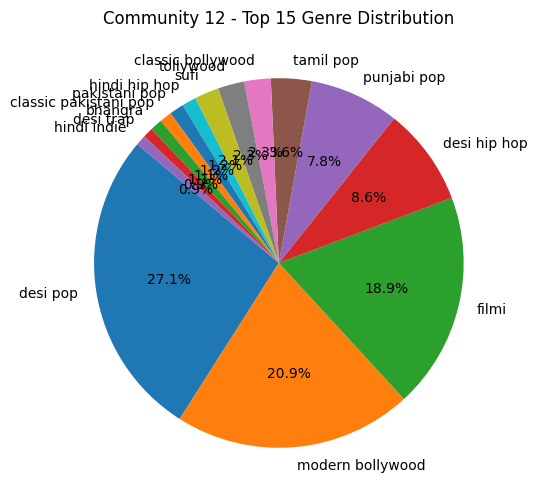

Average clustering coefficient for Community 12: 0.31954322413853137


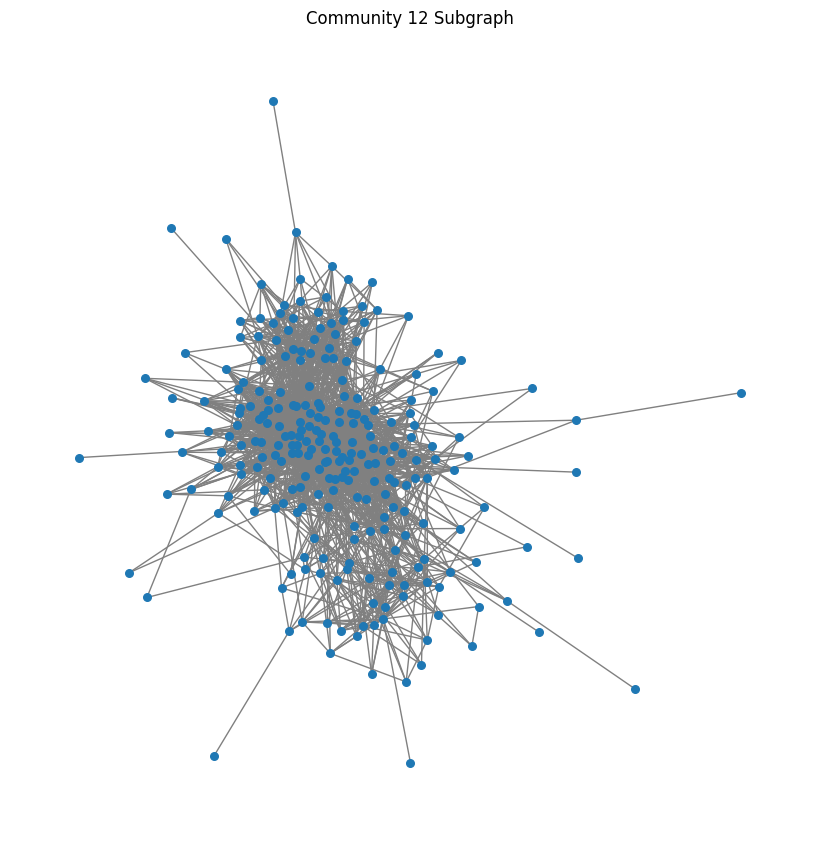

Artists in Community 30:
- Herra Hnetusmjör
- Robin Veela
- Admiral P
- Unga Scener
- Jireel
- Aron Can
- Carmon
- Swingfly
- Benal
- Jokeren
- Benjamin Beats
- Egill Ólafsson
- Artigeardit
- Ricky Rich
- Greekazo
- Miriam Bryant
- Infernal
- ADHD
- Staysman & Lazz
- Janice
- Yei Gonzalez
- Mapei
- Allyawan
- ICEKIID
- Fouli
- Imenella
- Diddú
- Soppgirobygget
- Harry
- Páll Óskar
- Dree Low
- BlazRoca
- Stress
- Iceland Symphony Orchestra
- Branco
- Skinz
- Emmsjé Gauti
- iSHi
- Sebastian Stakset
- Slæm Dønk
- Svenstrup & Vendelboe
- Bernhoft
- Veronica Maggio
- Finess
- Abidaz
- Alexander Rybak
- Burhan G
- Oh Land
- Nijo
- Yung Nigo Drippin'
- Aden x Asme
- Bubbi Morthens
- Stefán Hilmarsson
- Elli Grill
- Jülevenner
- Z.E
- Kór Öldutúnsskóla
- Ragnar Bjarnason
- Grillat & Grändy
- Parham
- B.Baby
- Katastrofe
- Jonas Benyoub
- Jamaika
- Daniil
- Molly Sandén
- Anders Matthesen
- Naod
- Eight O
- Benjamin Hav
- Daniel Adams-Ray
- Keya
- Lamix
- Pharfar
- Svante Thuresson
- Dårlig Va

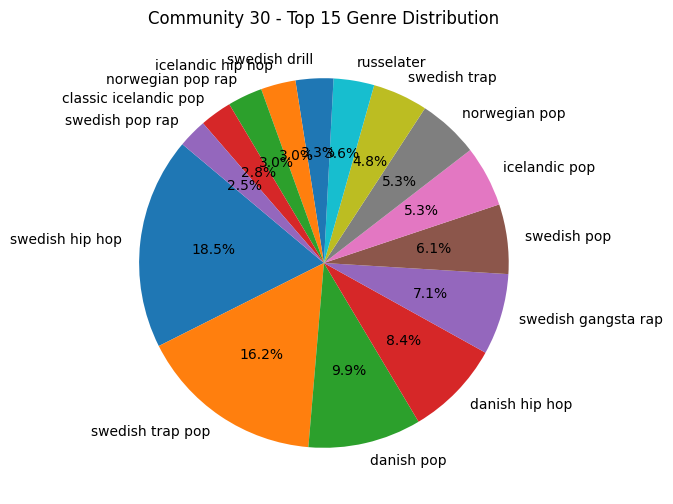

Average clustering coefficient for Community 30: 0.27322343216977324


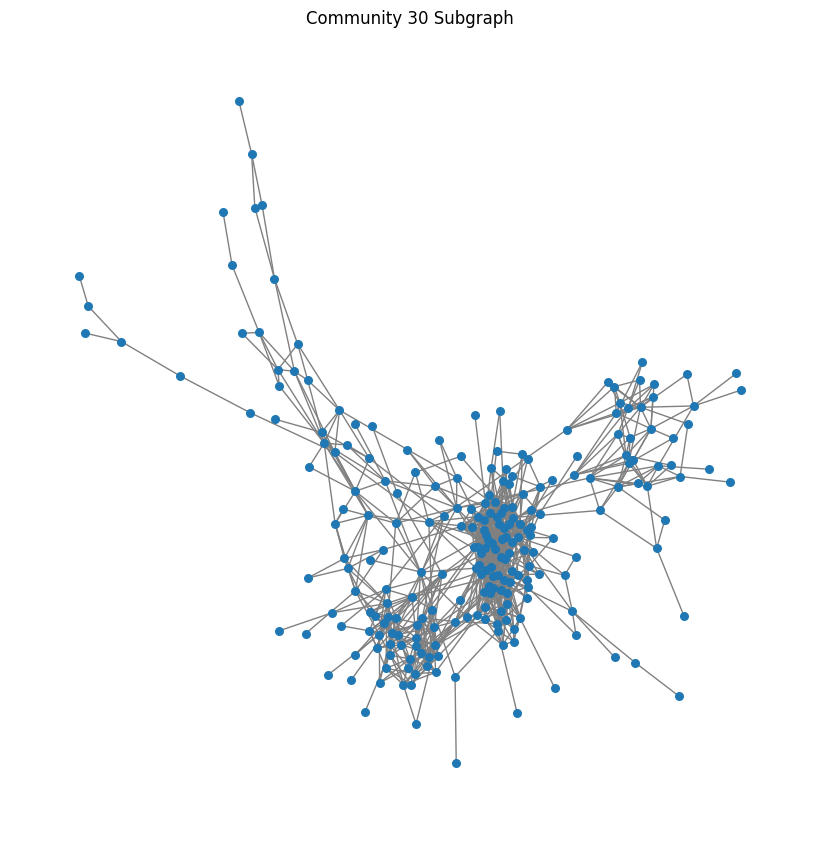

Artists in Community 19:
- Shane Eagle
- Miss Pru DJ
- DJ Stokie
- Villosoul
- Zuma
- Smallgod
- Luu Nineleven
- Kelvin Momo
- K.O
- Gaba Cannal
- Jub Jub
- Soweto's Finest
- Kweyama Brothers
- KayGee DaKing
- Cyfred
- DBN Gogo
- De Mthuda
- Stonebwoy
- Francois van Coke
- DJ Sumbody
- Alfa Kat
- Aymos
- Kamo Mphela
- Mellow & Sleazy
- Venom
- Sir Trill
- Major League Djz
- MashBeatz
- Tyler ICU
- Zoocci Coke Dope
- Makhadzi
- Sho Madjozi
- Slade
- Ami Faku
- Sayfar
- OSKIDO
- Blxckie
- Bontle Smith
- Oxlade
- GuiltyBeatz
- Mr JazziQ
- Mas Musiq
- Balcony Mix Africa
- Lira
- Patoranking
- Black Coffee
- Ntokzin
- Dlala Thukzin
- Da Les
- Semi Tee
- Kwiish SA
- Dladla Mshunqisi
- Junior De Rocka
- Mafikizolo
- Aubrey Qwana
- DJ Tira
- Busta 929
- Reece Madlisa
- Cassper Nyovest
- Emtee
- Early B
- Vetkuk
- Die Antwoord
- Nokwazi
- Salatiel
- Amanda Black
- Die Heuwels Fantasties
- Konke
- William Last KRM
- Prince Kaybee
- Daliwonga
- Killer Kau
- Mpura
- DJ Cleo
- Da Muziqal Chef
- DJ 

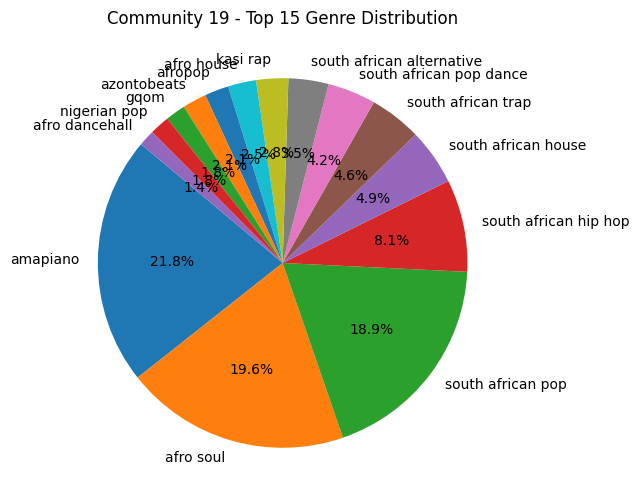

Average clustering coefficient for Community 19: 0.2587468721893305


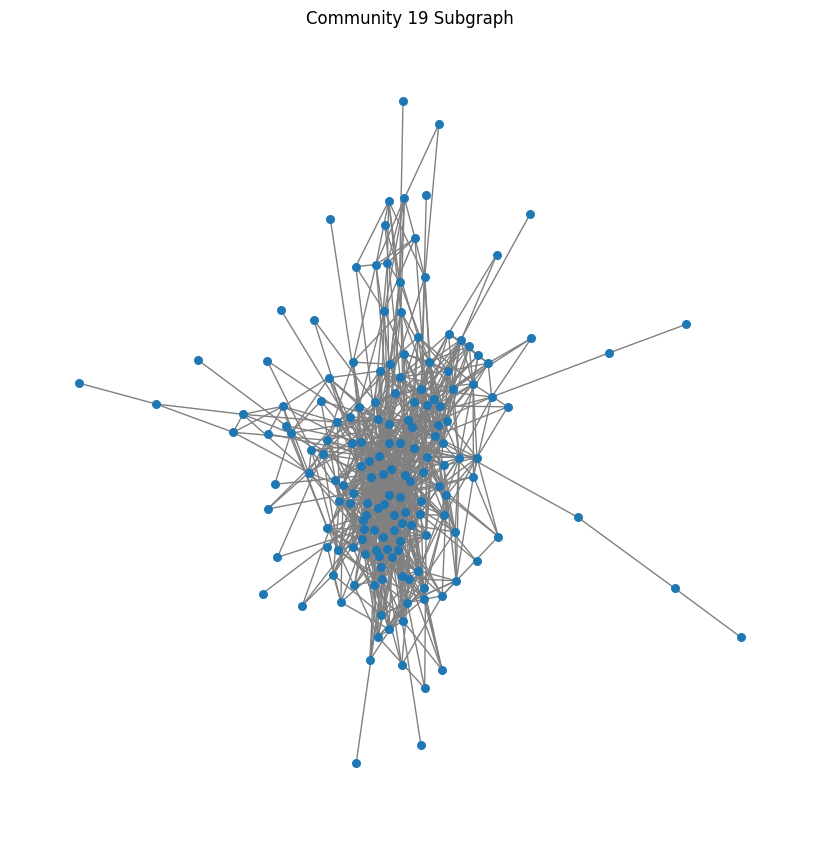

Artists in Community 10:
- Jerry Heil
- Lipa
- Słoń
- Cheatz
- Dj.Frodo
- Smolasty
- Michał Szczygieł
- Mrozu
- Dwa Sławy
- Kukon
- 2K
- Favst
- Remo
- MONATIK
- Sir Mich
- Natalia Nykiel
- Wiatr
- Bonus RPK
- White Widow
- Uzi
- Popkiller Młode Wilki
- Moli
- Krzysztof Zalewski
- Sentino
- Zdechły Osa
- ZetHa
- Ten Typ Mes
- Adi Nowak
- Kizo
- Ewa Farna
- Sokół
- Chris Carson
- Siles
- Paluch
- Young Multi
- Waima
- Otsochodzi
- KALUSH
- B.R.O
- Maciej Zielinski
- Swizzy
- Kubi Producent
- Natalia Kukulska
- Floral Bugs
- DZIARMA
- KęKę
- Hodak
- Onar
- Gibbs
- Dawid Podsiadło
- Diho
- Quebonafide
- Kali
- Dawid, Artysta
- Guzior
- Daria Zawiałow
- Bedoes
- Matheo
- GOLEC UORKIESTRA
- Brennan Savage
- SB Maffija
- Major SPZ
- Beteo
- Mata
- Gedz
- PlanBe
- schafter
- Oki
- TGD
- Worek
- Pezet
- Czarny HIFI
- Deys
- Szczyl
- Donguralesko
- VNM
- Kartky
- Dawid Kwiatkowski
- TUZZA Globale
- YARMAK
- Fresh N Dope
- Kaz Bałagane
- Sobota
- Borixon
- CatchUp
- Kronkel Dom
- Bonson
- Sitek


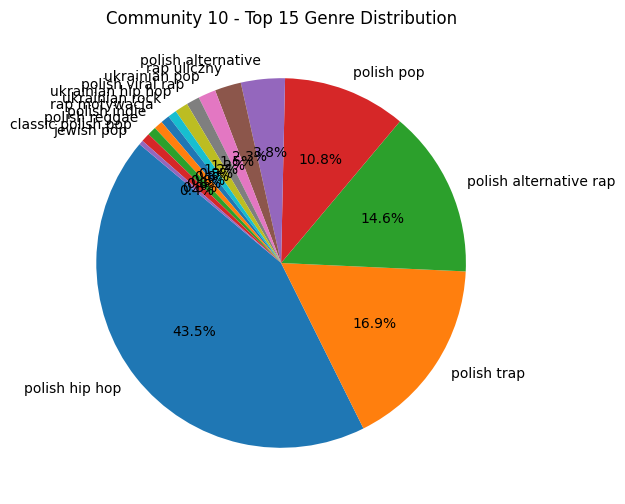

Average clustering coefficient for Community 10: 0.26745544562408324


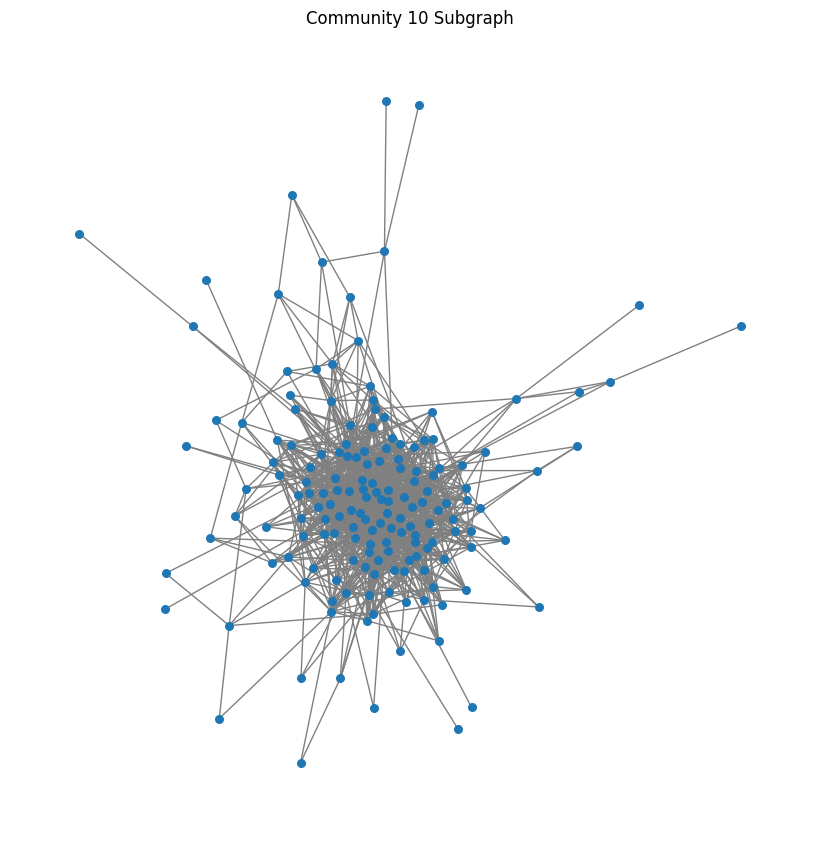

Artists in Community 28:
- Deep Zone Project
- Emanuela
- EMAA
- Tedi Aleksandrova
- Nikolas SAX
- Irina Rimes
- Monoir
- Idahams
- Costel Biju
- Calinacho
- andrei
- Miro
- YNY Sebi
- Holy Molly
- Adrian Funk
- The Motans
- Sapte
- Jluch
- Azis
- RAVA
- Konstantin
- Smiley
- Boris Dali
- Marko Glass
- MBT
- Krisko
- Serena
- Oscar
- ghosty punk
- El Nino
- Tsvetelina Yaneva
- Anelia
- Satra B.E.N.Z.
- Matteo
- Emilia
- 3 Sud Est
- Iuly Neamtu
- Dim4ou
- Galin
- Nikolas
- Florin Salam
- Yakki
- bbno$
- Petre Stefan
- Desanto
- Carla's Dreams
- DEM
- Susanu
- F.O.
- Criss Blaziny
- Tina Karol
- Manuel Riva
- Alexandra Stan
- Speak
- Dan Balan
- Alisia
- Andrea
- NOSFE
- Lidia Buble
- Exploit
- V:RGO
- Pascal Junior
- Galena
- MIRA
- AMI
- Otilia
- Costi
- Emilian
- Tussin
- Toni Storaro
- Alex Velea
- Ian
- Nane
- Cheloo
- Milioni
- Andra
- OG Eastbull
- Mom4eto
- GLDN
- Doddy
- Theo Rose
- Mihail
- Delia
- Fly Project
- Nicole Cherry
- Azteca
- VenZy
- Culita Sterp
- PRNY
- Spike
- Sas

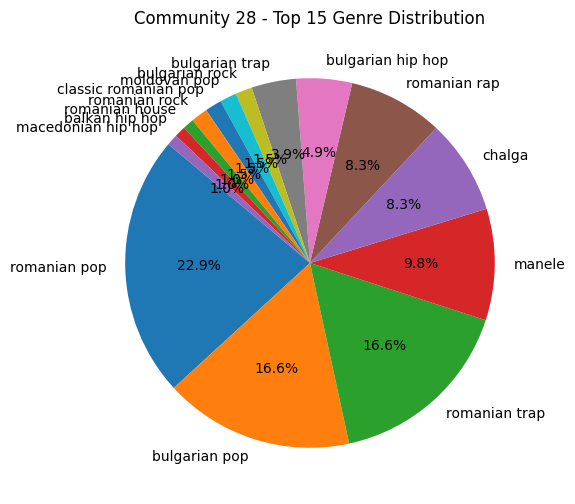

Average clustering coefficient for Community 28: 0.32469024841646243


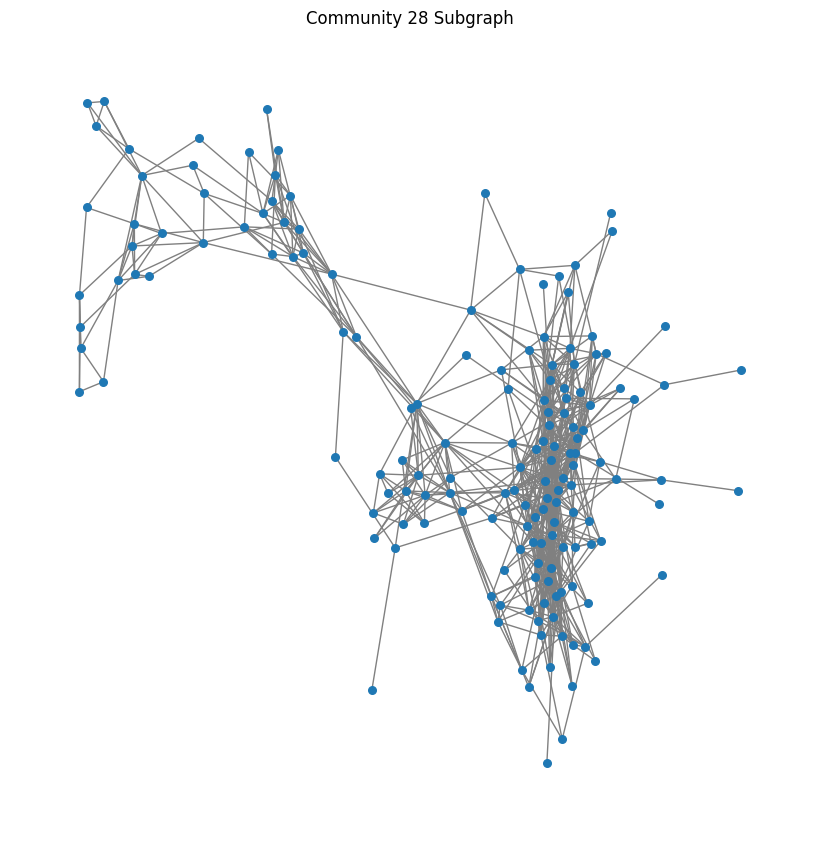

Artists in Community 43:
- Essemm
- DR BRS
- Manuel
- Bsw
- Misshmusic
- Marpo
- Halott Pénz
- AK
- Kontrafakt
- ScarcityBP
- DJ Kadr
- Karlo
- Renne Dang
- Lotfi Begi
- Tirpa
- Shimmi
- Helena Vondráčková
- Berkes Olivér
- Hasan
- Igor Kmeto
- Hana Zagorová
- Michal David
- Gleb
- Rytmus
- Nik Tendo
- Nerieš
- Čis T
- Separ
- Mikee Mykanic
- Viktor Sheen
- Tankcsapda
- Momo
- HRflow
- Kamil Hoffmann
- Rico
- Reza
- Calin
- Kelemen Kabátban
- Karel Gott
- Ego
- Sima
- The Biebers
- Boy Wonder
- Ty Nikdy
- Pixa
- Jickson
- G.w.M.
- DJ Wich
- Dame
- Medial Banana
- Tina
- Samey
- Adiss
- Frank Wild
- Killakikitt
- Reginald
- VALMAR
- Majself
- SpecialBeatz
- DeepThought
- Psycho Rhyme
- CA$HANOVA BULHAR
- Luca Brassi10x
- Refew
- Koukr
- Peter Pann
- T. Danny
- Duch
- SKiNNY BARBER
- Pil C
- Hundred Sins
- Kali
- Jakub Děkan
- Lucie Bílá
- Hugo Toxxx
- Robin Zoot
- Fobia Kid
- Lipo
- Smack
- Forest Blunt
- Strapo
- DMS
- Supa
- Marie Rottrova
- AKC Misi
- Martin Matys
- Mairee
- Robo Opa

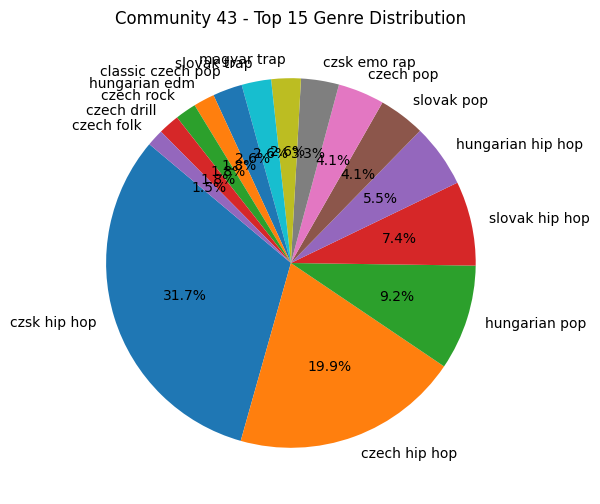

Average clustering coefficient for Community 43: 0.3973195375324363


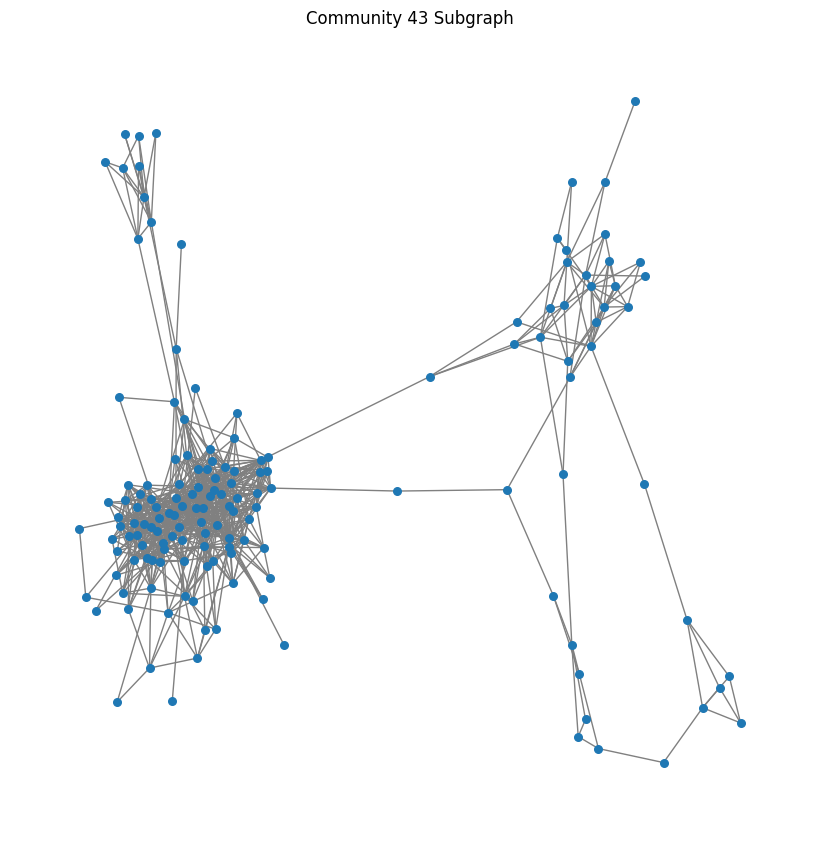

Artists in Community 40:
- ROCKET
- МОТ
- rolands če
- DOROFEEVA
- Prāta Vētra
- Truwer
- SLAVA MARLOW
- Zomb
- Gunwest
- Geegun
- Kreisais Krasts
- SALUKI
- VisaGangBeatz
- Artik & Asti
- Brainstorm
- NILETTO
- CMH
- Andro
- KILLY
- Edavārdi
- Vitya AK
- Intars Busulis
- Timati
- KURT92
- Yanix
- Jah Khalib
- Niman
- Oxxxymiron
- 163ONMYNECK
- Pika
- Lauris Reiniks
- Artem Pivovarov
- Basta
- Telly Grave
- blago white
- THRILL PILL
- Klava Koka
- Zivert
- КОСМОНАВТОВ НЕТ
- Singapūras Satīns
- Индаблэк
- Dima Bilan
- Bumble Beezy
- Ежемесячные
- DJ SMASH
- Clonnex
- Magnum Opus
- Aija Andrejeva
- Lusia Chebotina
- Mari Kraimbrery
- Aarne
- SODA LUV
- Husky
- SQWOZ BAB
- Ozols
- VACÍO
- Mumiy Troll
- GONE.Fludd
- Куок
- Lida
- M'Dee
- Thomas Mraz
- Basic Boy
- 104
- Jamala
- White Punk
- I61
- PLOHOYPAREN
- Urbanstep
- OBLADAET
- MORGENSHTERN
- S3RL
- MAYOT
- JEEMBO
- V $ X V PRiNCE
- LOVV66
- Skryptonite
- OG Buda
- Eldzhey
- Natan
- TVETH
- IGO
- ДЕТИ RAVE
- Mart Inc.
- VELIAL SQUAD
-

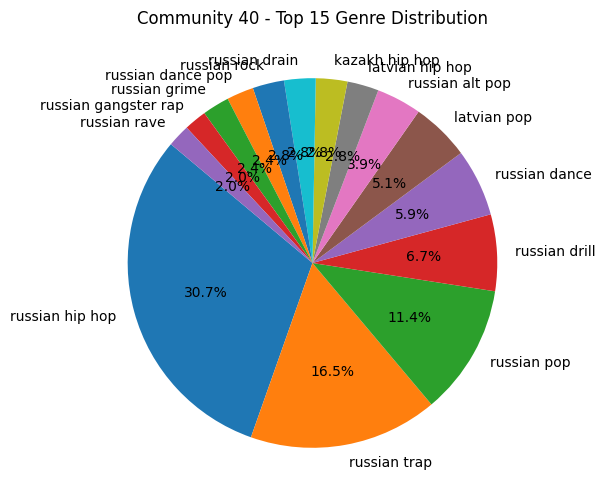

Average clustering coefficient for Community 40: 0.26837960142561285


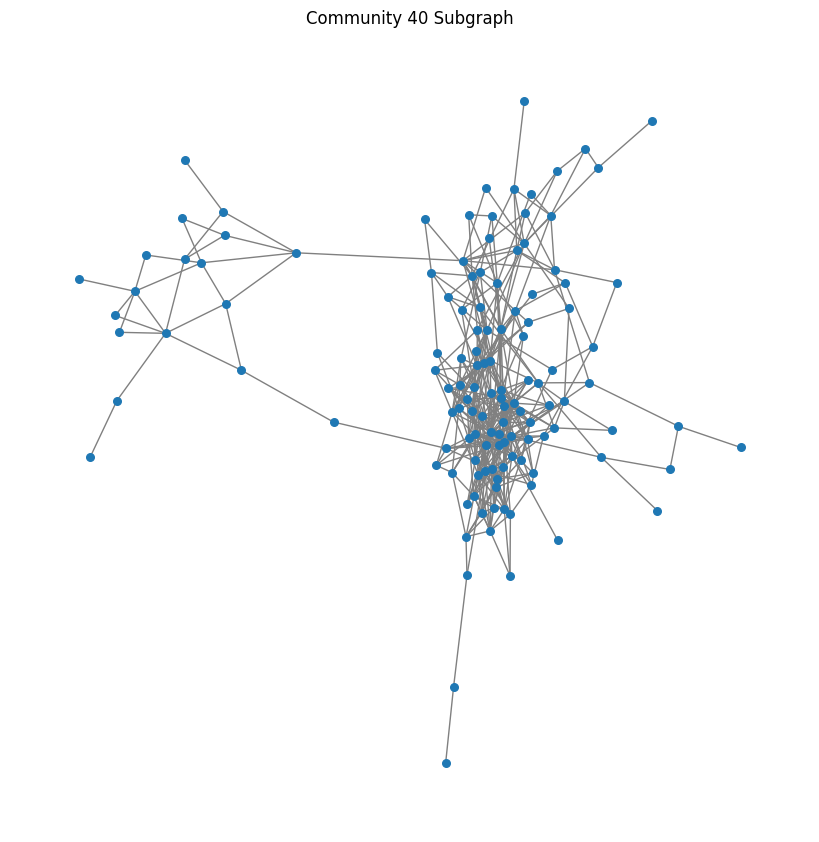

Artists in Community 24:
- J Hus
- LD
- Stylo G
- Dappy
- GRM Daily
- Maleek Berry
- Dimzy
- Knucks
- S1mba
- Ms Banks
- Team Salut
- Blanco
- Yungen
- MoStack
- Loyle Carner
- Loski
- Kenny Allstar
- E1 (3x3)
- Headie One
- Cadet
- Tion Wayne
- Poundz
- N-Dubz
- Stefflon Don
- Giggs
- Wes Nelson
- Digga D
- Mr Eazi
- Central Cee
- RaiM
- Aitch
- Yxng Bane
- Lethal Bizzle
- Nines
- Avelino
- Tana
- S-X
- D Double E
- K Koke
- Potter Payper
- Young T & Bugsey
- SL
- Swarmz
- D-Block Europe
- Toddla T
- Afro B
- Fumez The Engineer
- Morrisson
- M24
- Sneakbo
- Shakka
- Frosty
- Fekky
- Jaykae
- M1llionz
- Chip
- Frisco
- SwitchOTR
- BackRoad Gee
- Wiley
- Unknown T
- dutchavelli
- Crayon
- One Acen
- The Plug
- Alcemist
- ArrDee
- Not3s
- WSTRN
- Steel Banglez
- OFB
- Nafe Smallz
- Young Adz
- M.O
- Mixtape Madness
- Jme
- MIST
- B Young
- Conducta
- Geko
- Kano
- KSI
- ZieZie
- Ghetts
- Fredo
- Bugzy Malone
- NSG
- Nick Brewer
- Skepta
- Deno
- Abra Cadabra
- Rude Kid
- K-Trap
- Krept &

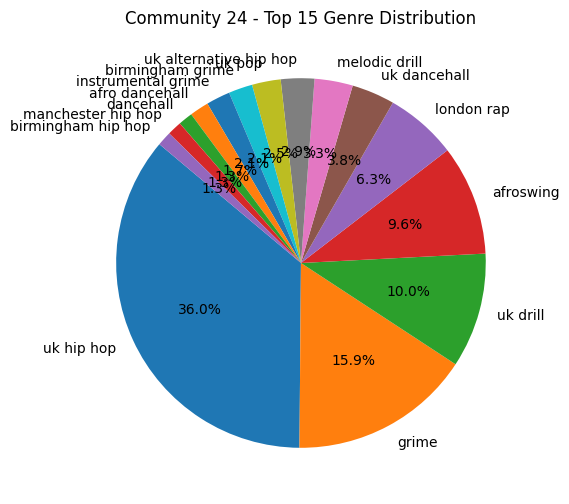

Average clustering coefficient for Community 24: 0.2960783793846496


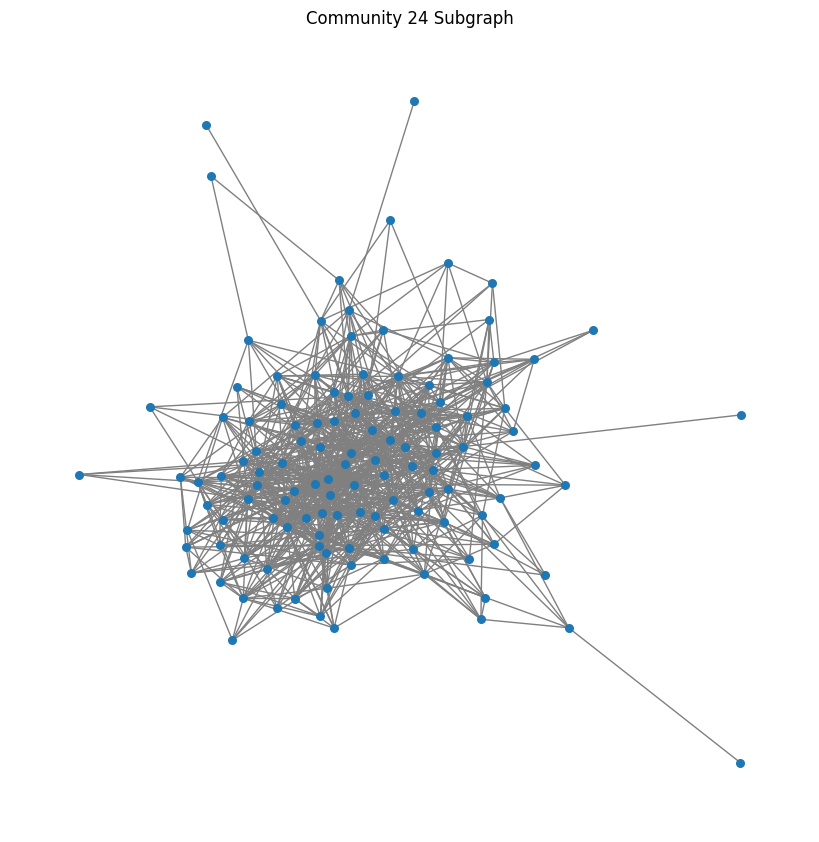

Artists in Community 41:
- Pykäri
- Spekti
- Paperi T
- Poju
- Chorale
- Pesso
- Juno
- JXO
- Juju
- Cheek
- Siimi
- Paleface
- Pajafella
- DJ Oku Luukkainen
- Raappana
- Tuomas Kauhanen
- Mansesteri
- Kasmir
- Kingfish
- Planeet
- Stig Dogg
- Pyhimys
- Elastinen
- Apocalyptica
- Teflon Brothers
- Dilemma
- Brädi
- Pikku G
- Slim Mill
- Nopsajalka
- IKE
- Taisto Tapulist
- Evelina
- TIPPA
- william
- Gasellit
- Redrama
- Pate Mustajärvi
- Millennium Project
- Michael Bleu
- DJ Massimo
- Aste
- Fabe
- Mikael Gabriel
- PastoriPike
- Rivo
- Mariska
- SMC Lähiörotat
- Ivo Linna
- Mäkki
- Robin
- Lord Est
- ibe
- ODE
- Kevin Tandu
- Ruma
- Põhja-Tallinn
- Nikke Ankara
- Adi L Hasla
- Bizi
- Särre
- Kube
- Stepa
- Yksi Totuus
- Cledos
- Skandaali
- Huge L
- F
- pluuto
- Eevil Stöö
- Katri Helena
- Herra Ylppö
- Gettomasa
- NCO
- Seksikäs-Suklaa
- ABREU
- The Rasmus
- KiROT
- Klamydia
- View
- Petri Nygård
- Chebaleba
- Sairas T
- Sini Sabotage
- Jeijjo & Nupi
- Reket
- Lukas Leon
- Keko Sala

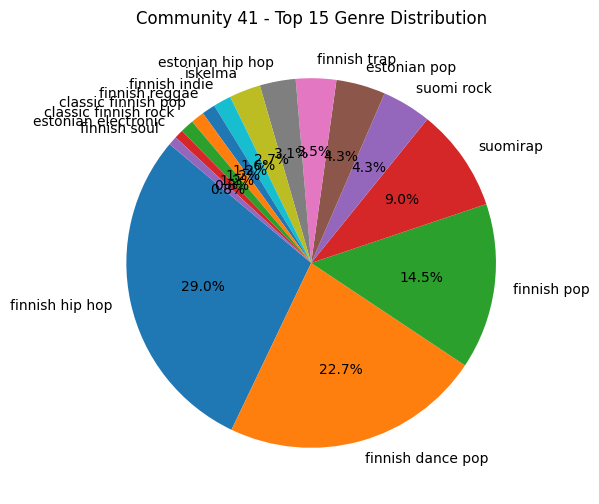

Average clustering coefficient for Community 41: 0.2451250892315257


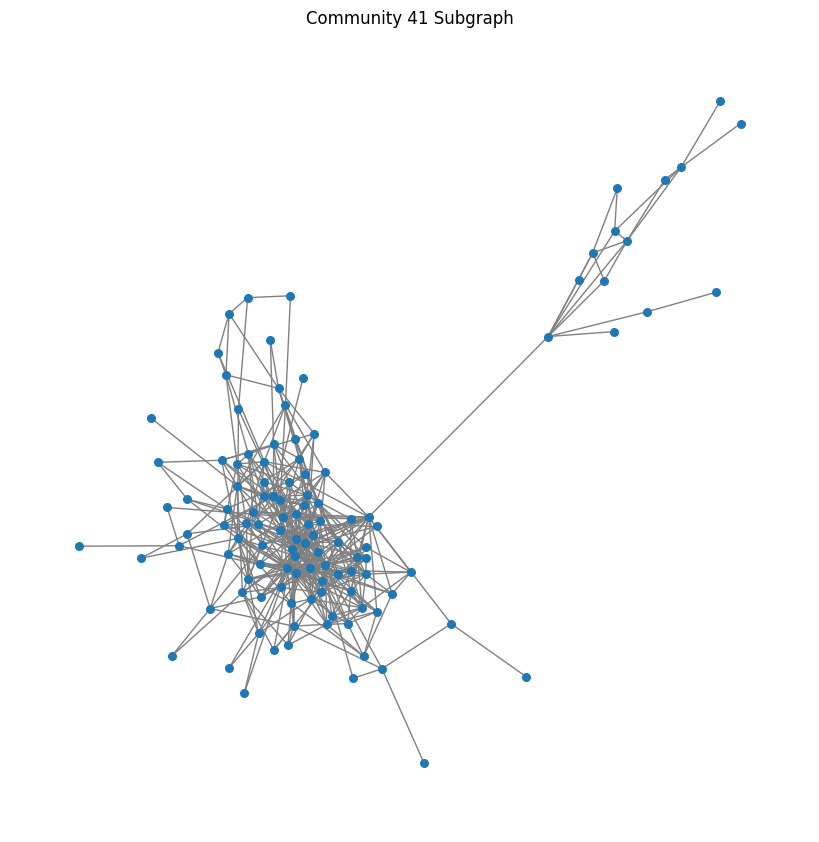

Artists in Community 8:
- Giorgos Papadopoulos
- Trannos
- Ypo
- Thitis
- Helena Paparizou
- Khay Be
- Joker/Two-Face
- Dj The Boy
- Eisvoleas
- Night Grind
- Baghdad
- Hatemost
- Trouf
- ATC Coco
- Mente Fuerte
- Ivan Greko
- Katy Garbi
- Light
- Livin R
- TOQUEL
- Hawk
- Negros Tou Moria
- Natasa Theodoridou
- ATC Toro
- Nume
- Vasilis Karras
- Long3
- Demy
- Eleni Foureira
- Thug Slime
- Michalis Hatzigiannis
- Tsaki
- Mike G
- Logos Timis
- Melisses
- Iratus
- Lil Koni
- Mad Clip
- Pepe Frantik
- Slogan
- DJ.Silence
- ATC Taff
- George Dalaras
- FANN
- DJ Stephan
- Bossikan
- Th Mark
- Ortiz
- Stan
- Tony Raw
- Lil Barty
- Antonis Remos
- Frej Larsson
- Billy Sio
- Xenia Ghali
- Strat
- Christos Mastoras
- Sele
- MG
- Ν.Ο.Ε.
- Kanon
- Tamta
- Dimitris Mitropanos
- SNIK
- Dof Twogee
- MUNEYLXRD
- Display
- Saske
- Oge
- Raps On The Run
- Mc Daddy
- Wang
- Sophia
- Dirty Harry
- Moose
- HGEMONA$
- iLLEOo
- Despina Vandi
- ATC Nico
- Immune
- Mani
- Herbert Grönemeyer
- Themis Adamant

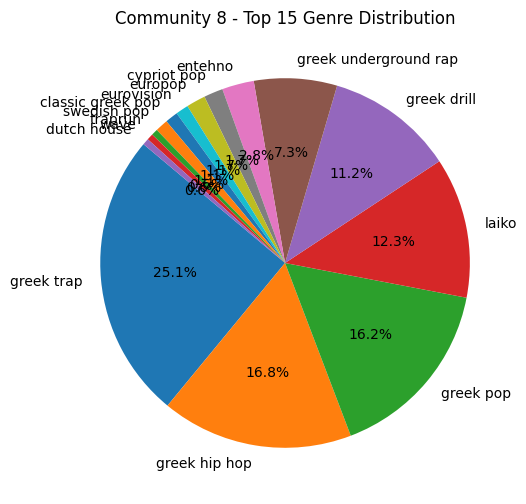

Average clustering coefficient for Community 8: 0.2794166443284227


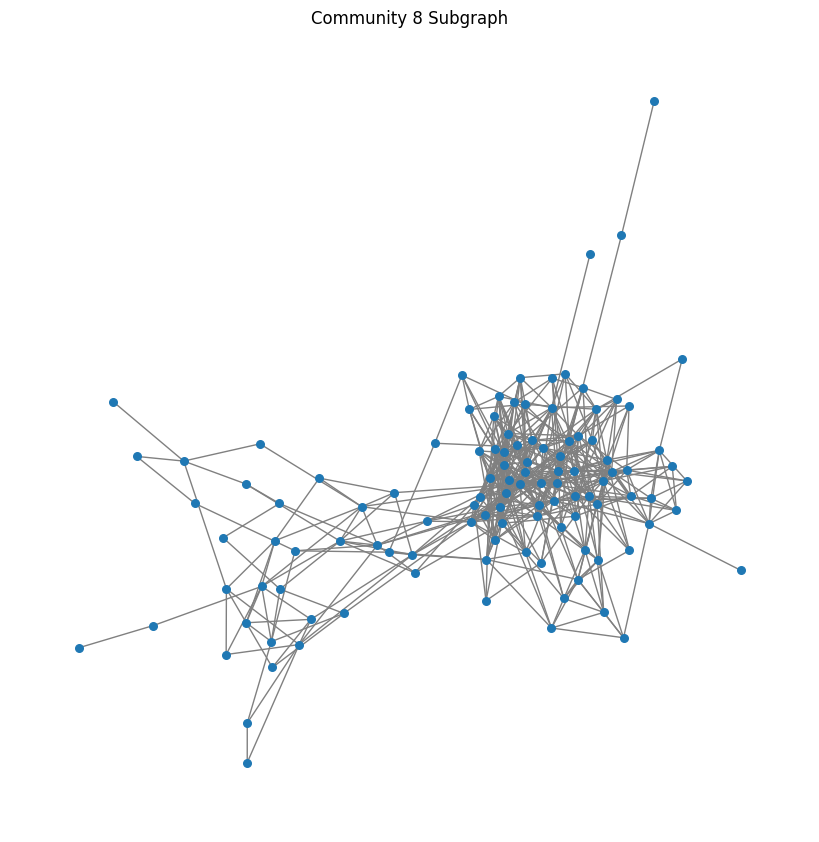

Artists in Community 14:
- ECHO
- The Ultras
- Lior Narkis
- הכוכב הבא
- Ravid Plotnik
- Shlomo Gronich
- Aviv Geffen
- Shlomo Artzi
- Narkis
- Arik Einstein
- NOROZ
- Teddy Neguse
- Harel Skaat
- Omer Adam
- Adi Ulmansky
- Sarit Hadad
- Tuna
- Avraham Tal
- Ido Shoam
- Mooki
- Mark Eliyahu
- Osher Cohen
- Red Band
- Dudu Tassa
- Rita
- Matti Caspi
- Carakukly
- Assaf Amdursky
- David Broza
- Maor Edri
- Peled
- Ivri Lider
- Dudu Aharon
- Karolina
- Elai Botner
- Keren Peles
- Moshe Peretz
- E-Z
- Offer Nissim
- Kobi Peretz
- Itay Levi
- Berry Sakharof
- Omri 69 Segal
- Shlomi Shabat
- Michael Swissa
- Nasrin Kadri
- Static & Ben El
- Hadag Nahash
- Eyal Golan
- Doli & Penn
- Atar Mayner
- Idan Raichel
- Noa Kirel
- Metro the Savage
- Eden Ben Zaken
- Eliad
- Zehava Ben

Community 14 Top 15 Genre Distribution:
- israeli pop: 22 artist(s)
- israeli mediterranean: 16 artist(s)
- israeli hip hop: 12 artist(s)
- mizrahi: 10 artist(s)
- israeli rock: 10 artist(s)
- classic israeli pop: 9 ar

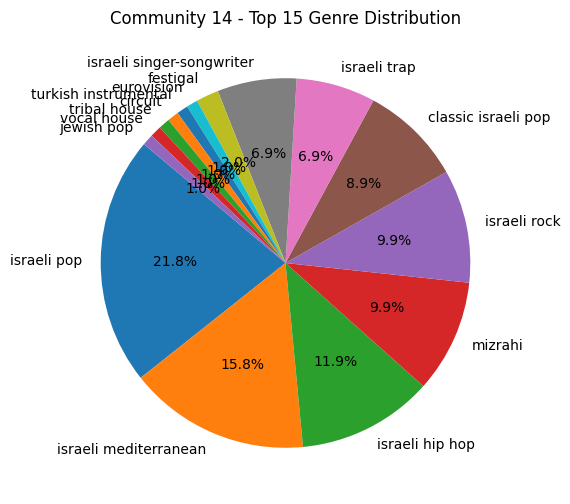

Average clustering coefficient for Community 14: 0.1760013865277023


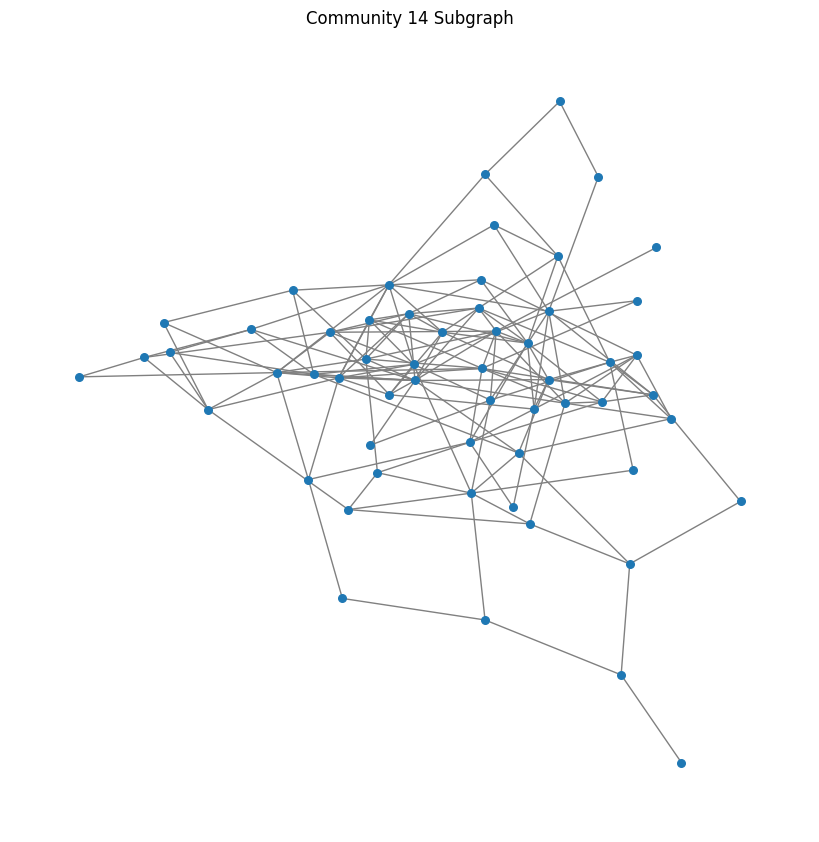

Artists in Community 27:
- Wegz
- Molotof
- Ahmed Saad
- El Sawareekh
- Hamo ElTikha
- Afroto
- Resha Costa
- مسلم
- Abo El Anwar
- Wezza Montaser
- Sadat
- G. Oka
- 3enba
- Felo
- Mohamed AlSalim
- حمو الطيخا
- Hamo Bika
- Omar Kamal
- Essam Sasa
- 7l2olo
- Ahmed Abdo
- Hoda Bondok
- Daffy
- Essam Saasa
- Blvxb
- Abo Lila
- Ali Adora
- احمد الدوجري
- Mody Amin
- El Madfaagya
- Ahmed Moza
- Ameen Khattab
- D1M1K

Community 27 Top 15 Genre Distribution:
- mahraganat: 23 artist(s)
- egyptian hip hop: 5 artist(s)
- egyptian trap: 4 artist(s)
- egyptian pop: 3 artist(s)
- shaabi: 3 artist(s)
- arab pop: 2 artist(s)
- gulf hip hop: 2 artist(s)
- khaleeji iraqi: 1 artist(s)
- khaliji: 1 artist(s)
- arabic hip hop: 1 artist(s)


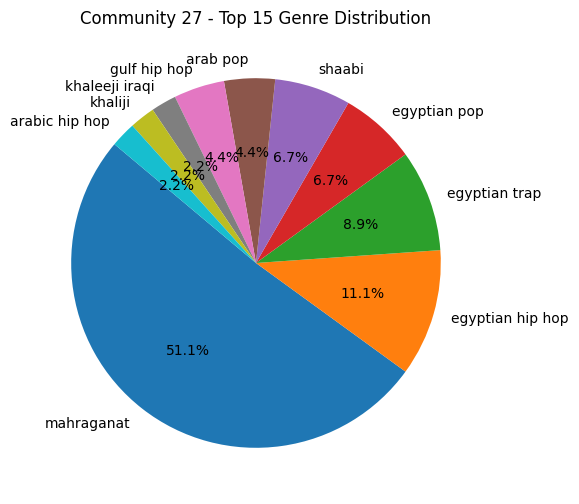

Average clustering coefficient for Community 27: 0.33811222447586087


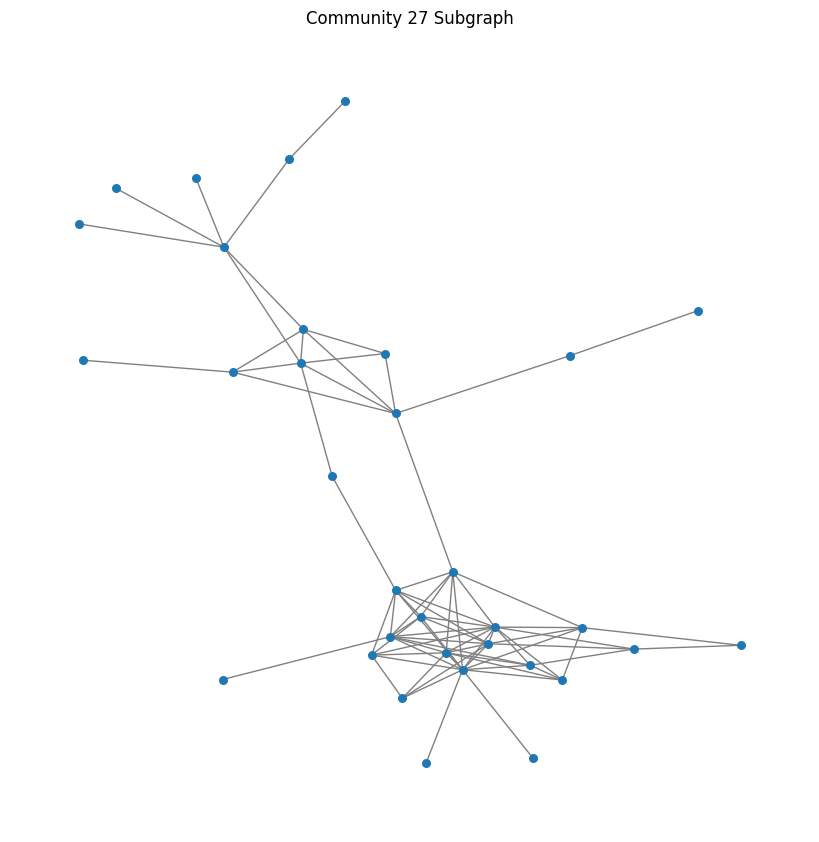

Artists in Community 79:
- Happy Asmara
- Yeni Inka
- Ndarboy Genk
- Didi Kempot
- Young Lex
- Woro Widowati
- Ecko Show
- Kemal Palevi
- Denny Caknan

Community 79 Top 15 Genre Distribution:
- javanese dangdut: 5 artist(s)
- lagu jawa: 5 artist(s)
- dangdut koplo: 4 artist(s)
- dangdut: 3 artist(s)
- indonesian hip hop: 3 artist(s)
- campursari: 1 artist(s)
- classic indo pop: 1 artist(s)
- indonesian emo rap: 1 artist(s)


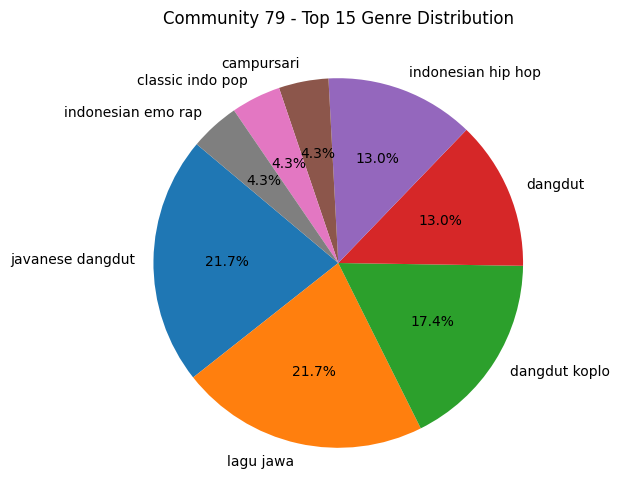

Average clustering coefficient for Community 79: 0.31481481481481477


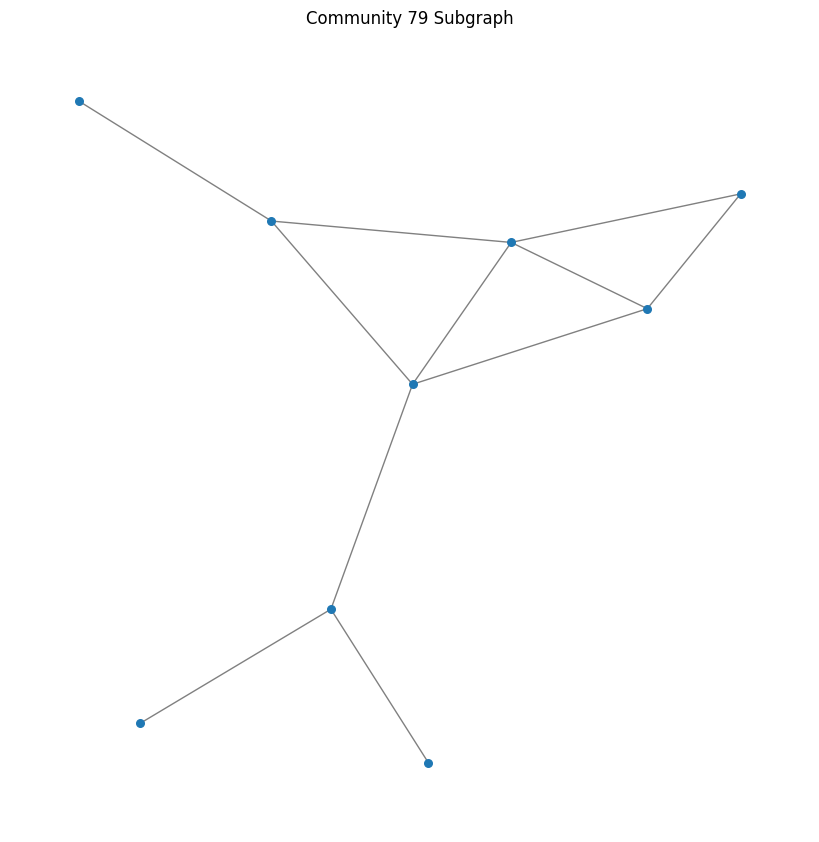

Artists in Community 75:
- Mustafa Al-Abdullah
- Aseel Hameem
- Saif Amer
- Mahmoud Al Turky
- Mamun Alnattah
- Nasrat Albader

Community 75 Top 15 Genre Distribution:
- khaleeji iraqi: 4 artist(s)
- khaliji: 4 artist(s)


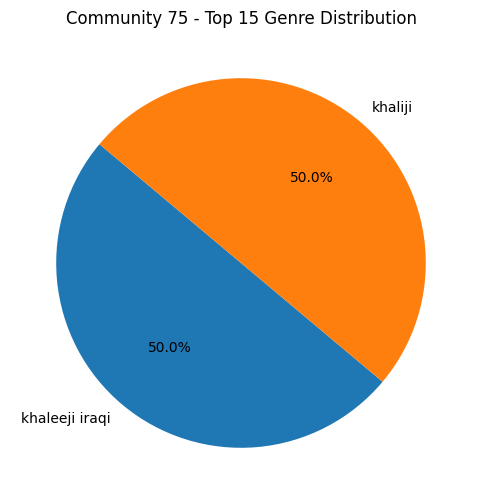

Average clustering coefficient for Community 75: 0.0


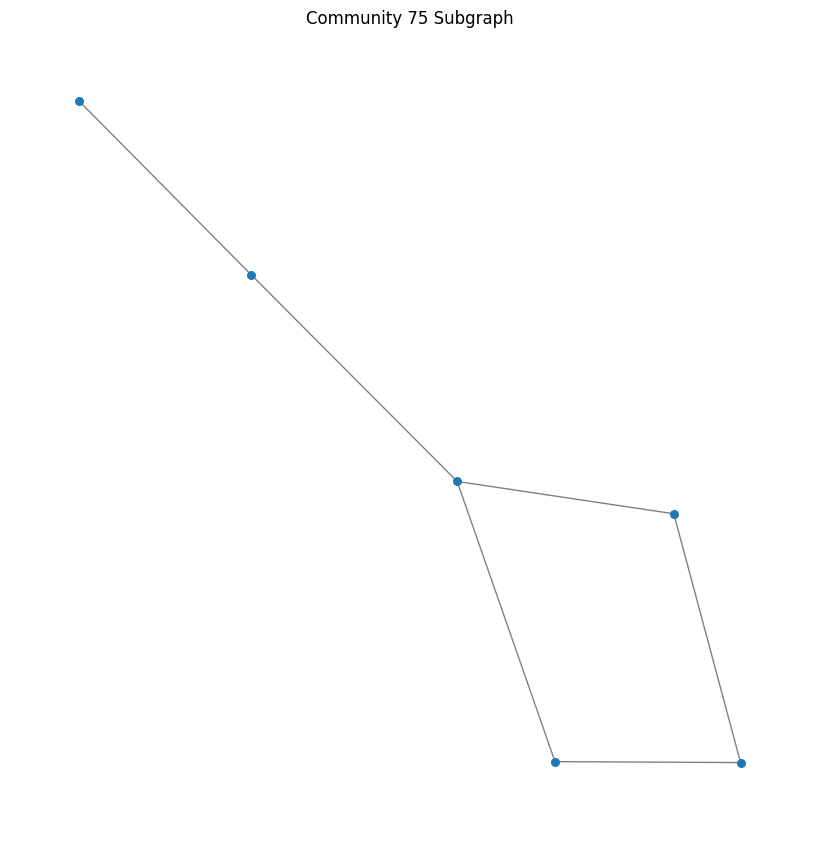

In [26]:
# Loop through each community with a minimum of 5 members, sorted by community size
for community_id, members in sorted(community_groups.items(), key=lambda x: len(x[1]), reverse=True)[:30]:
    # Process only if there are 5 or more artists in the community
    if len(members) < 5:
        continue
    
    # Create subgraph for this community
    community_subgraph = G.subgraph(members).copy()
    
    genre_count = defaultdict(int)
    artist_names = []
    
    # Count genres for each artist in the community
    for node in members:
        genres = G.nodes[node].get('genres', [])
        for genre in genres:
            genre_count[genre] += 1

        artist_name = G.nodes[node].get('name', 'Unknown')
        artist_names.append(artist_name)

    # Print the artists in the community
    print(f"Artists in Community {community_id}:")
    for artist in artist_names:
        print(f"- {artist}")

    # Sort genres by count and select the top 15
    sorted_genres = sorted(genre_count.items(), key=lambda x: x[1], reverse=True)[:15]
    
    # Only process if there are genres in this community
    if sorted_genres:
        genres, counts = zip(*sorted_genres)
        print(f"\nCommunity {community_id} Top 15 Genre Distribution:")
        
        # Display genre distribution
        for genre, count in zip(genres, counts):
            print(f"- {genre}: {count} artist(s)")
        
        # Plot pie chart
        plt.figure(figsize=(6, 6))
        plt.pie(counts, labels=genres, autopct='%1.1f%%', startangle=140)
        plt.title(f"Community {community_id} - Top 15 Genre Distribution")
        plt.show()
        
    # Optional: analyze clustering coefficient of the subgraph
    clustering_coefficient = nx.average_clustering(community_subgraph)
    print(f"Average clustering coefficient for Community {community_id}: {clustering_coefficient}")
    
    # You can also plot the subgraph if desired
    pos = nx.spring_layout(community_subgraph, seed=42)
    plt.figure(figsize=(8, 8))
    nx.draw(community_subgraph, pos, with_labels=False, node_size=30, edge_color='gray')
    plt.title(f"Community {community_id} Subgraph")
    plt.show()


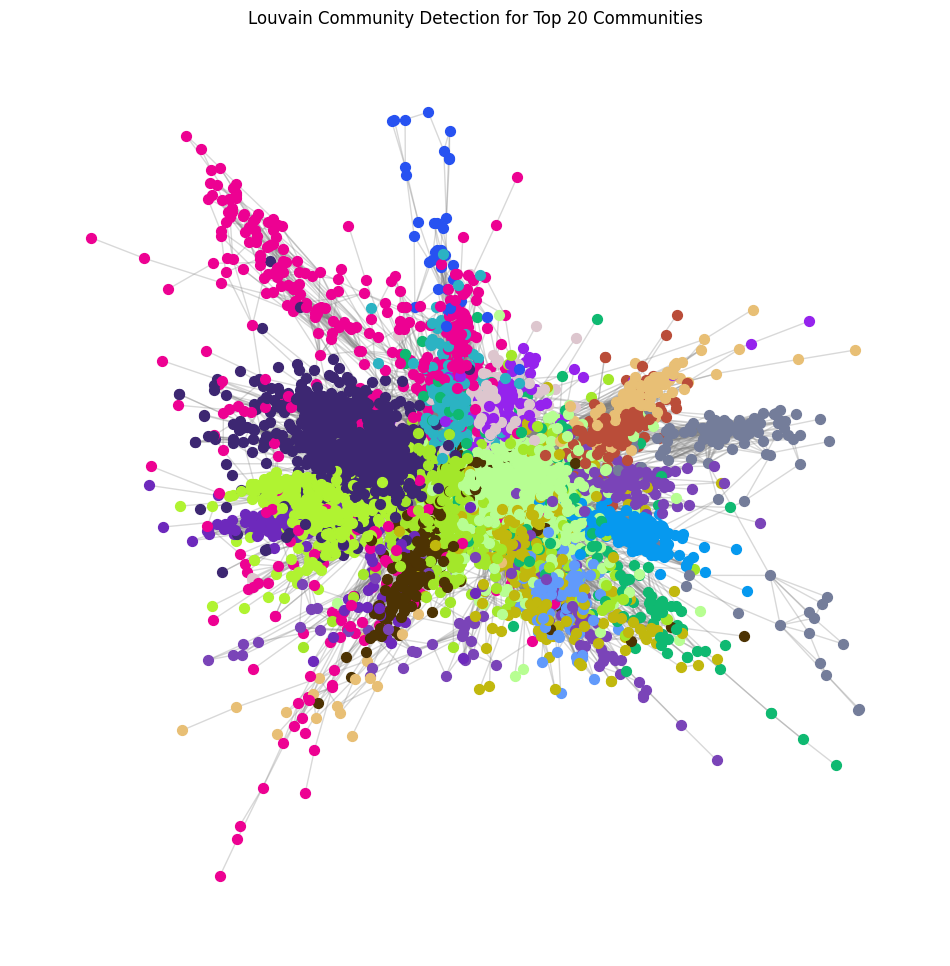

In [27]:
# runtime 1min

# Choose the top 20 communities based on size
top_20_communities = sorted(community_groups.items(), key=lambda x: len(x[1]), reverse=True)[:20]

# Create a new NetworkX graph with only nodes from the top 20 communities
top_20_nodes = [node for community_id, members in top_20_communities for node in members]
top_20_subgraph = G.subgraph(top_20_nodes).copy()

# Apply Louvain partitioning on the top 20 subgraph
top_20_partition = community_louvain.best_partition(top_20_subgraph)

# Generate colors for each community
unique_communities = list(set(top_20_partition.values()))
community_colors = {community_id: (random.random(), random.random(), random.random()) for community_id in unique_communities}

# Get positions for visualization
pos = nx.spring_layout(top_20_subgraph, seed=42)

# Plot the graph with communities colored
plt.figure(figsize=(12, 12))
for node, community_id in top_20_partition.items():
    nx.draw_networkx_nodes(top_20_subgraph, pos, nodelist=[node], node_size=50, node_color=[community_colors[community_id]])

nx.draw_networkx_edges(top_20_subgraph, pos, alpha=0.3, edge_color="gray")
plt.title("Louvain Community Detection for Top 20 Communities")
plt.axis("off")
plt.show()

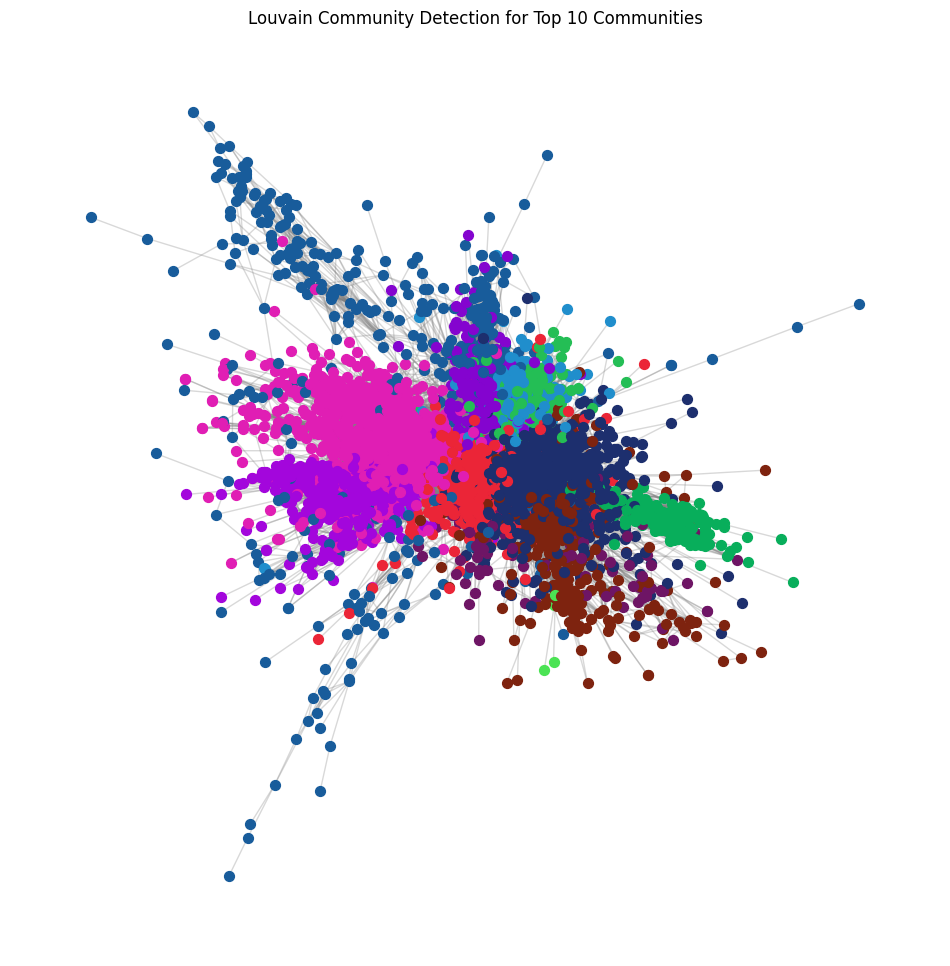

In [29]:
# runtime 2min

# Choose the top 10 communities based on size
top_10_communities = sorted(community_groups.items(), key=lambda x: len(x[1]), reverse=True)[:10]

# Create a graph with only nodes from the top 10 communities
top_10_nodes = [node for community_id, members in top_10_communities for node in members]
top_10_subgraph = G.subgraph(top_10_nodes).copy()

# Apply Louvain partitioning on the top 10 subgraph
top_10_partition = community_louvain.best_partition(top_10_subgraph)

# Generate colors for each community
unique_communities = list(set(top_10_partition.values()))
community_colors = {community_id: (random.random(), random.random(), random.random()) for community_id in unique_communities}

# Get positions for visualization
pos = nx.spring_layout(top_20_subgraph, seed=42)

# Plot the graph with communities colored
plt.figure(figsize=(12, 12))
for node, community_id in top_10_partition.items():
    nx.draw_networkx_nodes(top_10_subgraph, pos, nodelist=[node], node_size=50, node_color=[community_colors[community_id]])

nx.draw_networkx_edges(top_10_subgraph, pos, alpha=0.3, edge_color="gray")
plt.title("Louvain Community Detection for Top 10 Communities")
plt.axis("off")
plt.show()